# Análise da Série histórica do levantamento de preços e de margens de comercialização de combustíveis

A ANP (Agência Nacional do Petróleo, Gás Natural e Biocombustíveis) disponibiliza a série histórica do Levantamento de Preços e de Margens de Comercialização de Combustíveis semanal e mensal. As séries históricas incluem os seguintes combustíveis: gasolina comum, etanol hidratado, óleo diesel não aditivado, gás natural veicular (GNV), gás liquefeito de petróleo (GLP – botijão de 13 quilos) e o óleo diesel S-10.

Aqui será analisada a série histórica semanal por estado da federação desde 2013.

https://www.gov.br/anp/pt-br/assuntos/precos-e-defesa-da-concorrencia/precos/precos-revenda-e-de-distribuicao-combustiveis/serie-historica-do-levantamento-de-precos

## Objetivos

* Realizar uma análise exploratória dos dados disponibilizados pela ANP.
* Determinar os estados em que houve a maior alta/baixa de preços de combustíveis no período disponível (2004 a 2020).
* Determinar os combustíveis que sofreram os maiores aumentos/as maiores baixas de preço no período disponível (2004 a 2020).
* Determinar o estado com o maior número de postos de combustíveis.
* Determinar o estado com a maior diferença entre o preço médio de distribuição e o preço médio de revenda.
* Determinar o estado com o maior/o menor preço de revenda de cada combustível.
* Determinar o produto mais barato/caro por estado.
* Determinar o produto mais barato/caro por região.
* Determinar o produto mais barato/caro no país.

### Análise Exploratória dos Dados

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#importando os dados
dados_2004_2012 = pd.read_excel('Dados ANP/semanal-estados-2004-a-2012.xlsx', na_values=['-'], decimal=',', header=12)
dados_desde_2013 = pd.read_excel('Dados ANP/semanal-estados-desde-2013.xlsx', na_values=['-'], decimal=',', header=17)

dados = pd.concat([dados_2004_2012, dados_desde_2013], ignore_index=True)
dados.head()

,DATA INICIAL,DATA FINAL,REGIÃO,ESTADO,PRODUTO,NÚMERO DE POSTOS PESQUISADOS,UNIDADE DE MEDIDA,PREÇO MÉDIO REVENDA,DESVIO PADRÃO REVENDA,PREÇO MÍNIMO REVENDA,PREÇO MÁXIMO REVENDA,MARGEM MÉDIA REVENDA,COEF DE VARIAÇÃO REVENDA,PREÇO MÉDIO DISTRIBUIÇÃO,DESVIO PADRÃO DISTRIBUIÇÃO,PREÇO MÍNIMO DISTRIBUIÇÃO,PREÇO MÁXIMO DISTRIBUIÇÃO,COEF DE VARIAÇÃO DISTRIBUIÇÃO
0,2004-05-09,2004-05-15,CENTRO OESTE,DISTRITO FEDERAL,ETANOL HIDRATADO,127,R$/l,1.288,0.016,1.19,1.350,0.463,0.012,0.825,0.110,0.4201,0.96660,0.133
1,2004-05-09,2004-05-15,CENTRO OESTE,GOIAS,ETANOL HIDRATADO,387,R$/l,1.162,0.114,0.89,1.449,0.399,0.098,0.763,0.088,0.5013,1.05000,0.115
2,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO,ETANOL HIDRATADO,192,R$/l,1.389,0.097,1.18,1.760,0.419,0.070,0.970,0.095,0.5614,1.16100,0.098
3,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO DO SUL,ETANOL HIDRATADO,162,R$/l,1.262,0.070,1.09,1.509,0.432,0.055,0.830,0.119,0.5991,1.22242,0.143
4,2004-05-09,2004-05-15,NORDESTE,ALAGOAS,ETANOL HIDRATADO,103,R$/l,1.181,0.078,1.05,1.400,0.240,0.066,0.941,0.077,0.7441,1.03170,0.082


In [3]:
dados.dtypes

DATA INICIAL                     datetime64[ns]
DATA FINAL                       datetime64[ns]
REGIÃO                                   object
ESTADO                                   object
PRODUTO                                  object
NÚMERO DE POSTOS PESQUISADOS              int64
UNIDADE DE MEDIDA                        object
PREÇO MÉDIO REVENDA                     float64
DESVIO PADRÃO REVENDA                   float64
PREÇO MÍNIMO REVENDA                    float64
PREÇO MÁXIMO REVENDA                    float64
MARGEM MÉDIA REVENDA                    float64
COEF DE VARIAÇÃO REVENDA                float64
PREÇO MÉDIO DISTRIBUIÇÃO                float64
DESVIO PADRÃO DISTRIBUIÇÃO              float64
PREÇO MÍNIMO DISTRIBUIÇÃO               float64
PREÇO MÁXIMO DISTRIBUIÇÃO               float64
COEF DE VARIAÇÃO DISTRIBUIÇÃO           float64
dtype: object

In [4]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155251 entries, 0 to 155250
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   DATA INICIAL                   155251 non-null  datetime64[ns]
 1   DATA FINAL                     155251 non-null  datetime64[ns]
 2   REGIÃO                         155251 non-null  object        
 3   ESTADO                         155251 non-null  object        
 4   PRODUTO                        155251 non-null  object        
 5   NÚMERO DE POSTOS PESQUISADOS   155251 non-null  int64         
 6   UNIDADE DE MEDIDA              155251 non-null  object        
 7   PREÇO MÉDIO REVENDA            155251 non-null  float64       
 8   DESVIO PADRÃO REVENDA          155251 non-null  float64       
 9   PREÇO MÍNIMO REVENDA           155251 non-null  float64       
 10  PREÇO MÁXIMO REVENDA           155251 non-null  float64       
 11  

In [5]:
print(f'Dimensões: {dados.shape} ({dados.ndim} dimensões)\nLinhas: {len(dados)} Colunas: {len(dados.iloc[0])}')

Dimensões: (155251, 18) (2 dimensões)
Linhas: 155251 Colunas: 18


In [6]:
dados.describe(include = 'all')

,DATA INICIAL,DATA FINAL,REGIÃO,ESTADO,PRODUTO,NÚMERO DE POSTOS PESQUISADOS,UNIDADE DE MEDIDA,PREÇO MÉDIO REVENDA,DESVIO PADRÃO REVENDA,PREÇO MÍNIMO REVENDA,PREÇO MÁXIMO REVENDA,MARGEM MÉDIA REVENDA,COEF DE VARIAÇÃO REVENDA,PREÇO MÉDIO DISTRIBUIÇÃO,DESVIO PADRÃO DISTRIBUIÇÃO,PREÇO MÍNIMO DISTRIBUIÇÃO,PREÇO MÁXIMO DISTRIBUIÇÃO,COEF DE VARIAÇÃO DISTRIBUIÇÃO
count,155251,155251,155251,155251,155251,155251.000000,155251,155251.000000,155251.000000,155251.000000,155251.000000,111875.000000,155251.000000,111915.000000,111915.000000,111915.000000,111915.000000,111915.000000
unique,NaN,NaN,5,27,8,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NORDESTE,RIO GRANDE DO SUL,GASOLINA COMUM,NaN,R$/l,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,53433,6170,28775,NaN,108764,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2015-06-12 01:41:03.265292800,2015-06-18 01:41:03.265292800,NaN,NaN,NaN,197.981340,NaN,13.574817,0.828041,11.812039,15.717701,2.324677,0.045714,8.916643,0.580658,7.744055,10.199183,0.046302
min,2004-05-09 00:00:00,2004-05-15 00:00:00,NaN,NaN,NaN,1.000000,NaN,0.766000,0.000000,0.590000,0.999000,0.001000,0.000000,0.506000,0.000000,0.325700,0.599200,0.000000
25%,2010-05-30 00:00:00,2010-06-05 00:00:00,NaN,NaN,NaN,35.000000,NaN,2.399000,0.083000,2.190000,2.690000,0.289000,0.029000,1.843000,0.048000,1.711600,1.987150,0.021000
50%,2015-10-11 00:00:00,2015-10-17 00:00:00,NaN,NaN,NaN,86.000000,NaN,3.460000,0.142000,3.190000,3.850000,0.391000,0.042000,2.434000,0.080000,2.292200,2.607000,0.031000
75%,2020-11-08 00:00:00,2020-11-14 00:00:00,NaN,NaN,NaN,202.000000,NaN,6.020000,0.287000,5.599000,6.840000,0.577000,0.059000,3.438000,0.156000,3.278700,3.648050,0.060000
max,2025-01-12 00:00:00,2025-01-18 00:00:00,NaN,NaN,NaN,4167.000000,NaN,137.300000,19.347000,130.000000,160.000000,36.847000,0.591000,83.137000,18.385000,83.000000,94.500000,0.780000


In [7]:
dados.columns = dados.columns.str.lower().str.replace(' ', '_')

In [8]:
dados.isnull().sum()

data_inicial                         0
data_final                           0
região                               0
estado                               0
produto                              0
número_de_postos_pesquisados         0
unidade_de_medida                    0
preço_médio_revenda                  0
desvio_padrão_revenda                0
preço_mínimo_revenda                 0
preço_máximo_revenda                 0
margem_média_revenda             43376
coef_de_variação_revenda             0
preço_médio_distribuição         43336
desvio_padrão_distribuição       43336
preço_mínimo_distribuição        43336
preço_máximo_distribuição        43336
coef_de_variação_distribuição    43336
dtype: int64

In [9]:
dados['ano'] = pd.to_datetime(dados.data_final).dt.year
anos = dados.ano.unique().tolist()

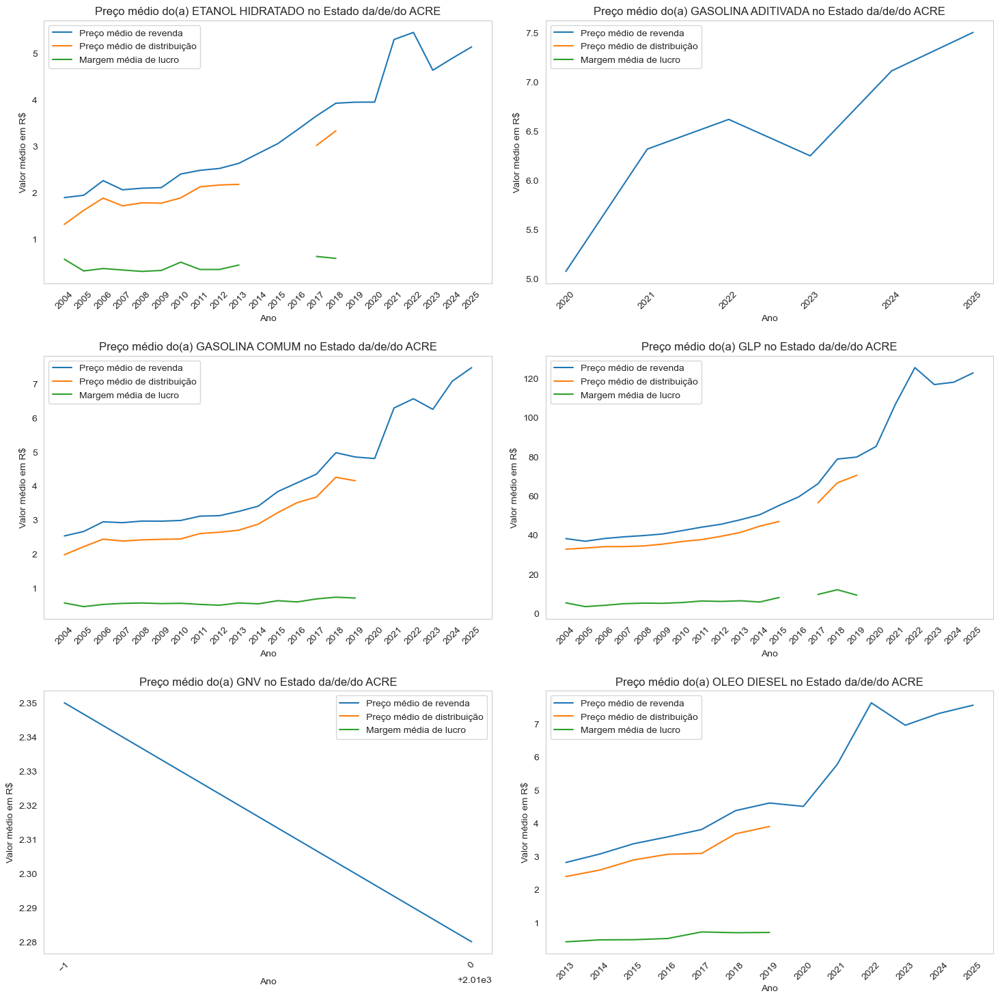

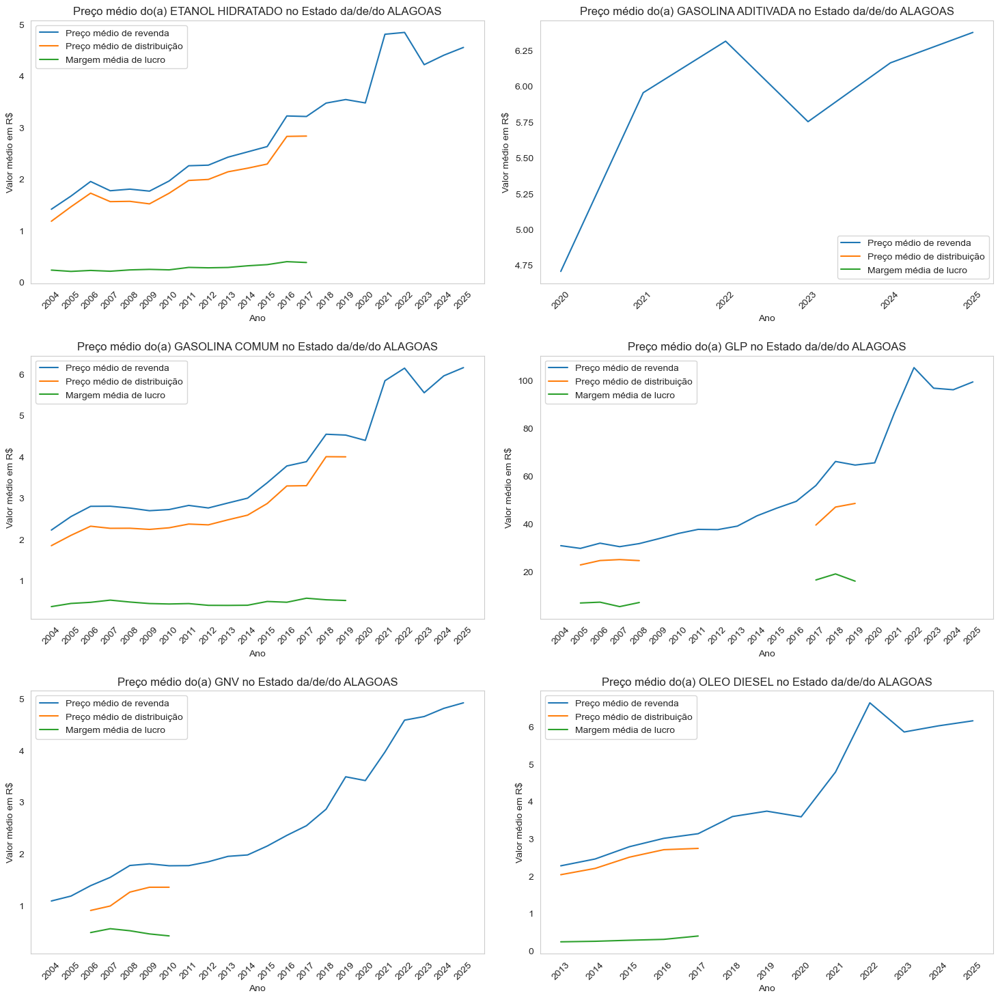

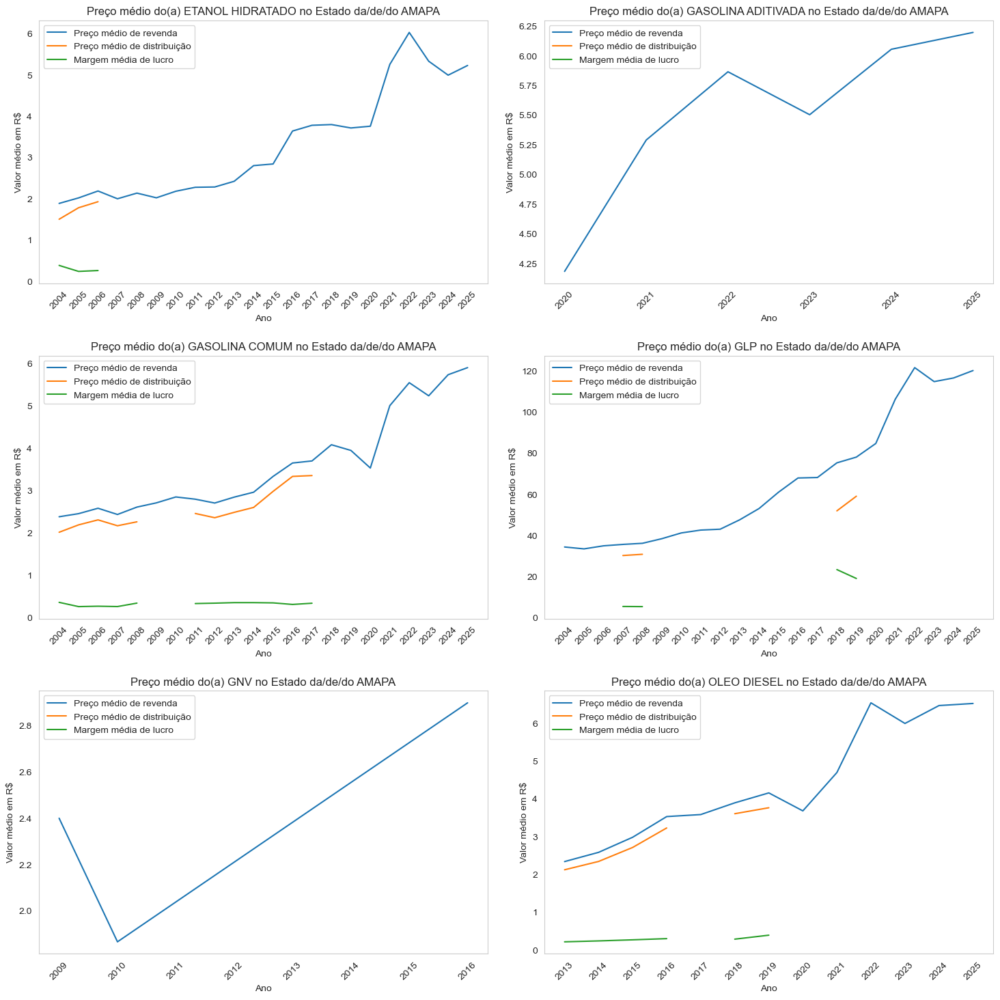

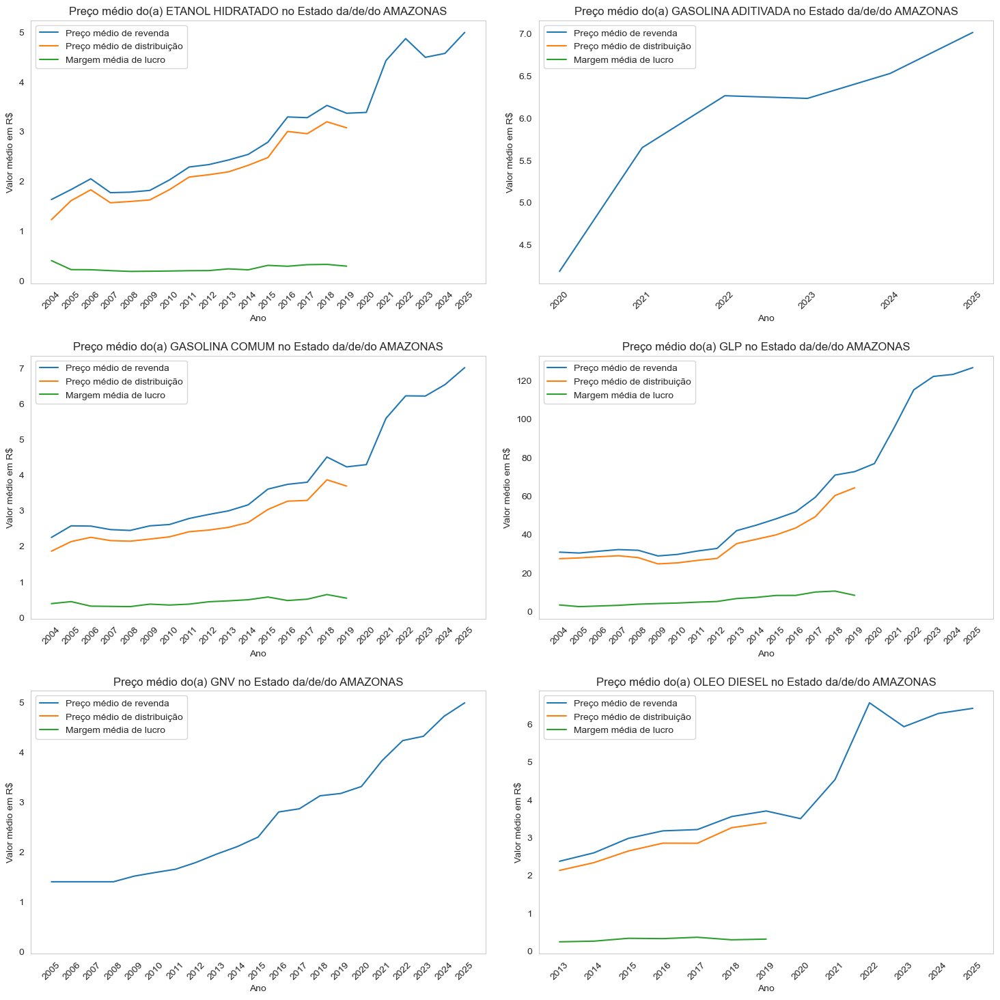

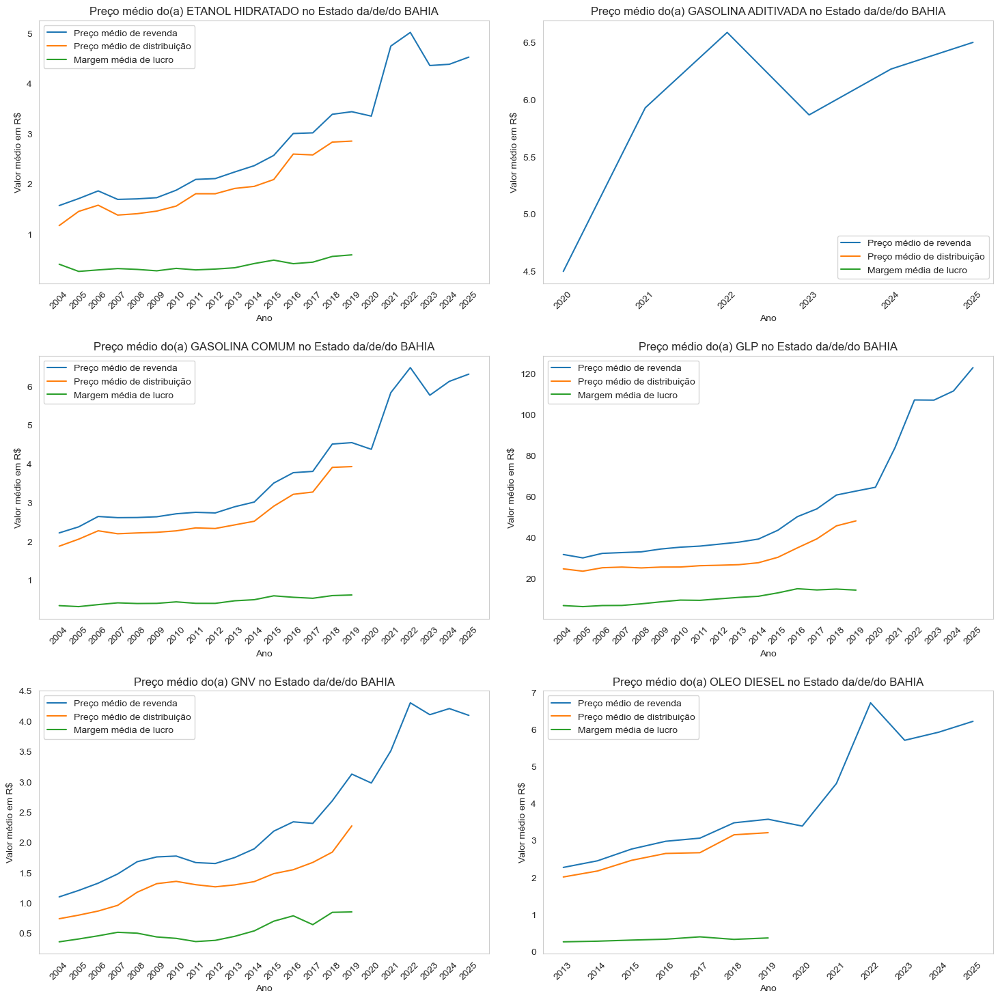

...

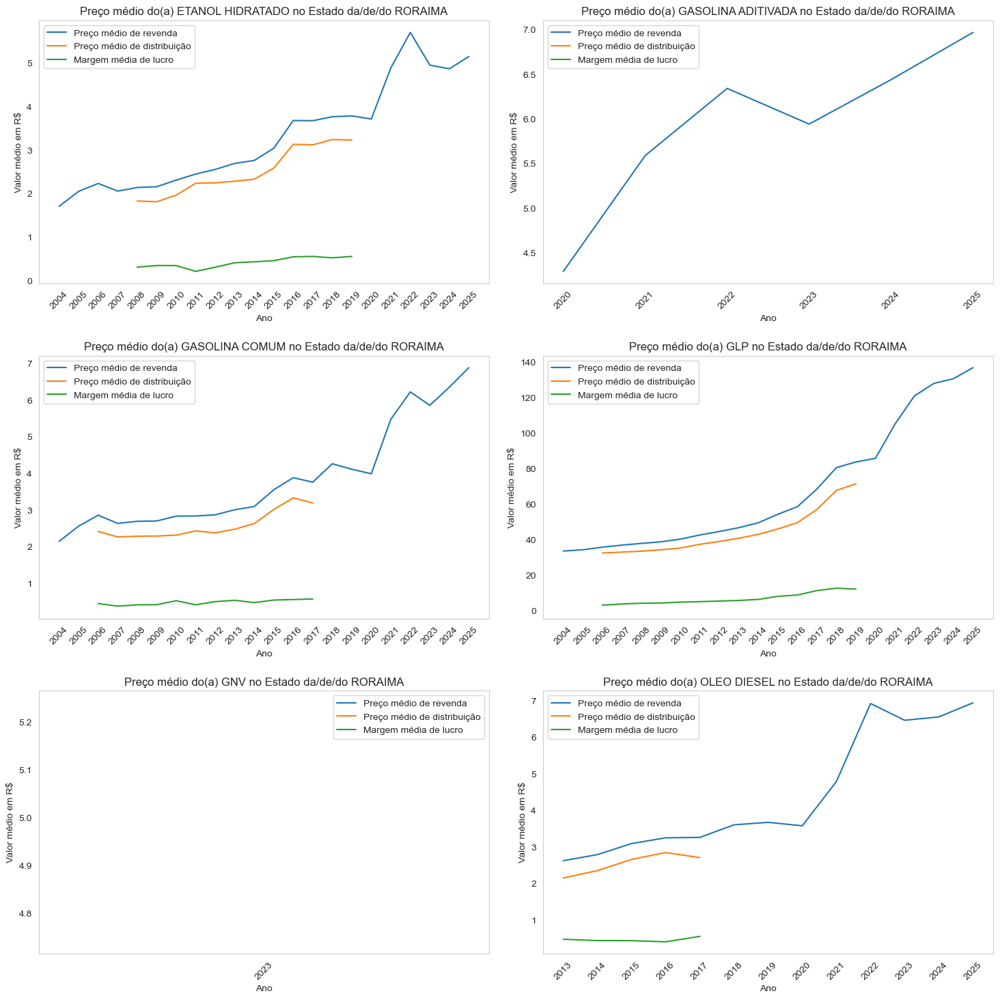

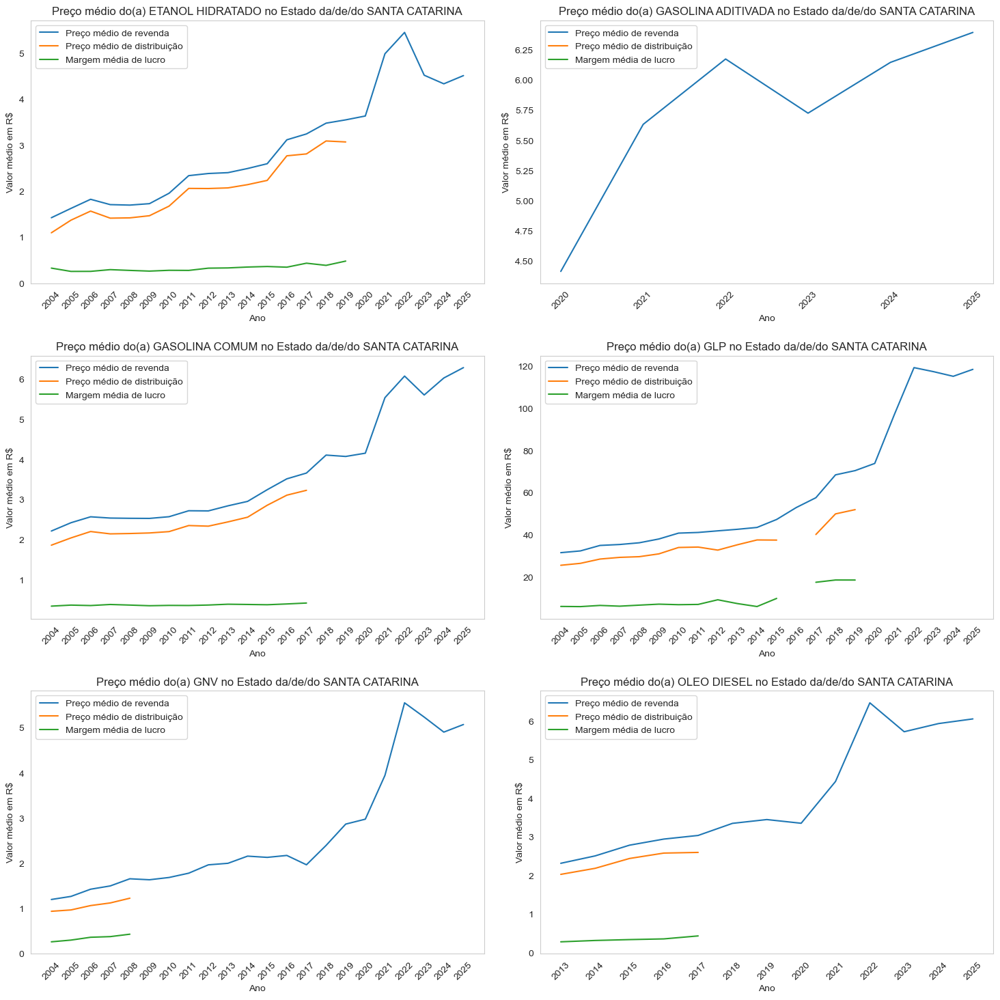

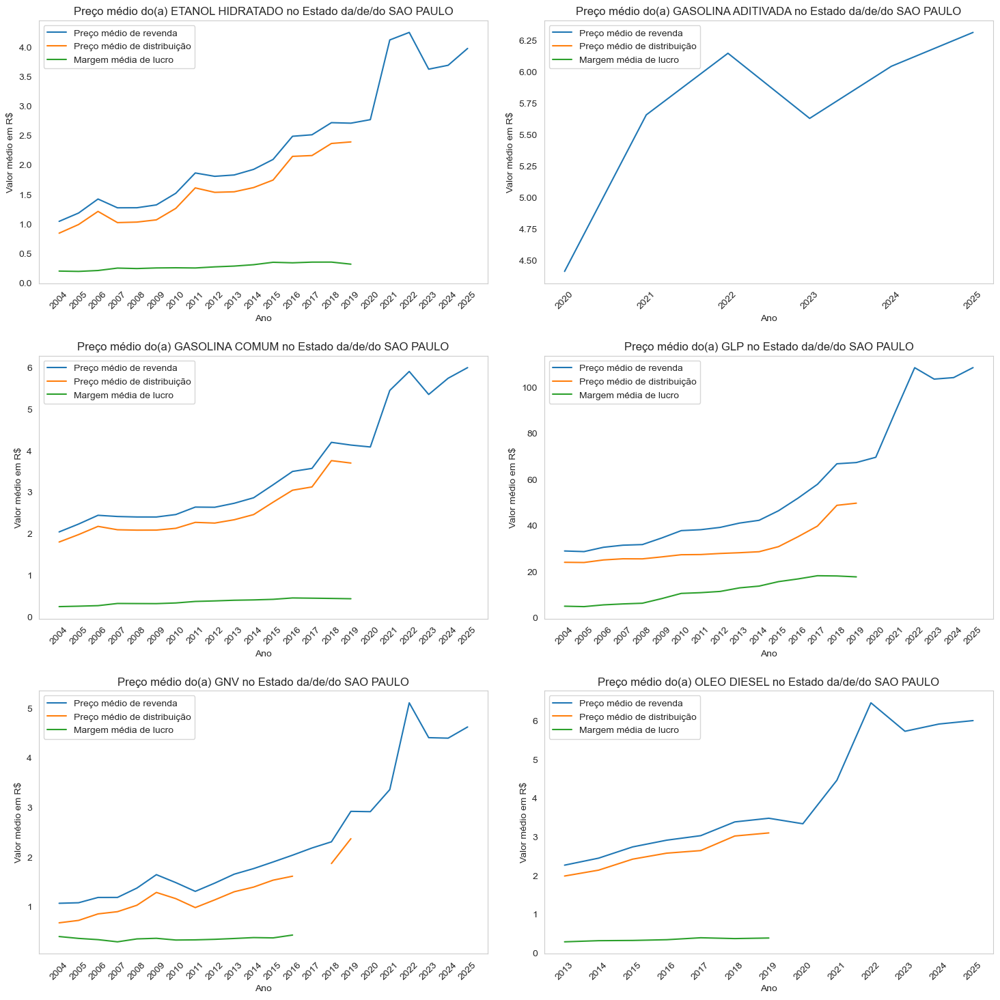

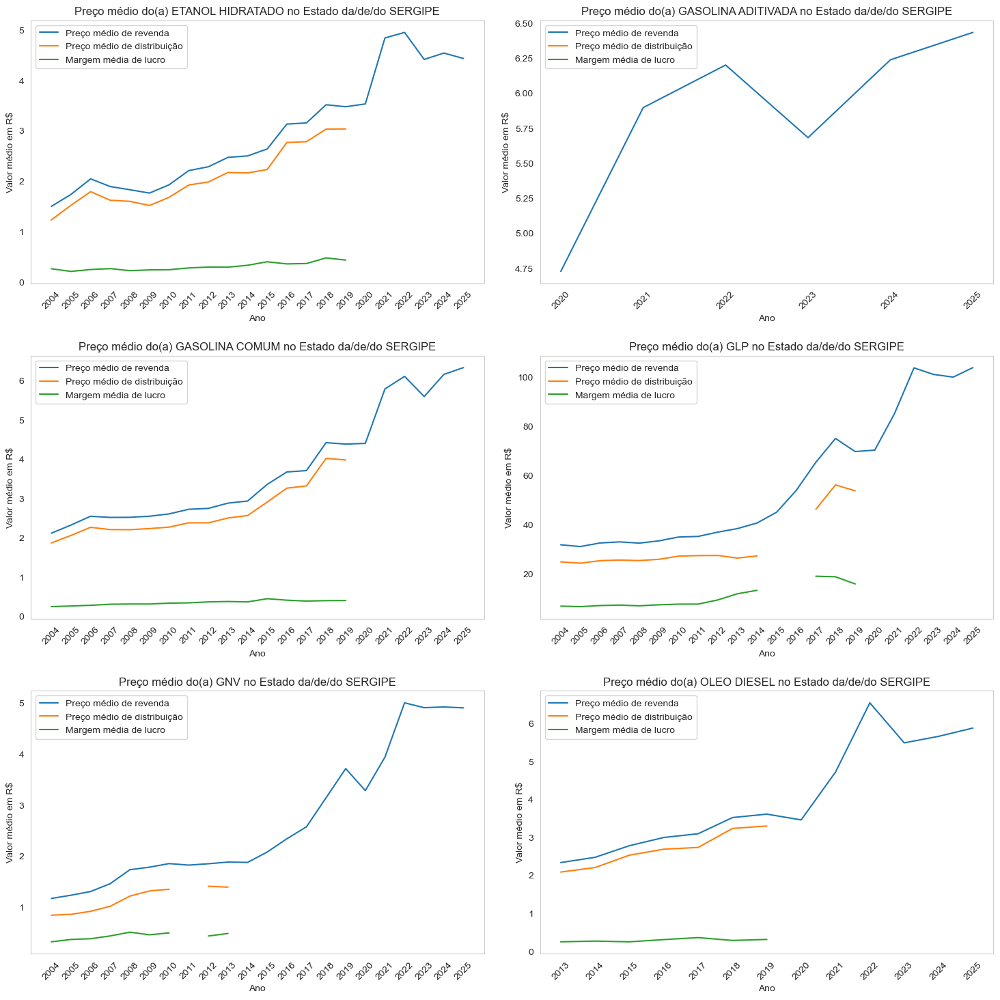

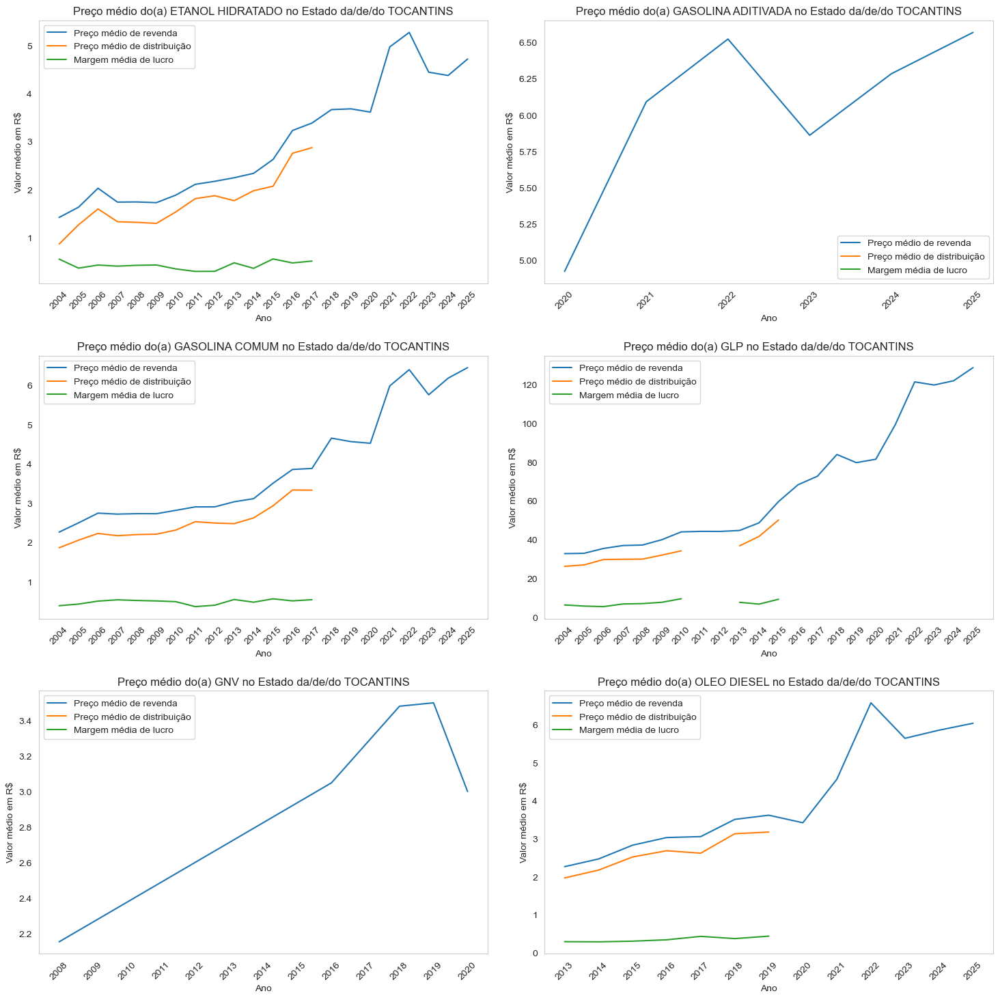

,ano,estado,produto,preço_médio_revenda,preço_médio_distribuição,margem_média_revenda
0,2004,ACRE,ETANOL HIDRATADO,1.898515,1.323455,0.575061
1,2004,ACRE,GASOLINA COMUM,2.528636,1.974758,0.553879
2,2004,ACRE,GLP,38.232848,32.821758,5.411091
3,2004,ACRE,ÓLEO DIESEL,1.837515,1.507424,0.330091
4,2004,ALAGOAS,ETANOL HIDRATADO,1.414788,1.181697,0.233091
...,...,...,...,...,...,...
3323,2025,TOCANTINS,GASOLINA ADITIVADA,6.570000,NaN,NaN
3324,2025,TOCANTINS,GASOLINA COMUM,6.450000,NaN,NaN
3325,2025,TOCANTINS,GLP,128.600000,NaN,NaN
3326,2025,TOCANTINS,OLEO DIESEL,6.040000,NaN,NaN


In [79]:
def preco_por_estado():
    produtos = dados.produto.sort_values().unique().tolist()

    precos_revenda = dados[['ano', 'estado', 'produto', 'preço_médio_revenda']] \
                          .groupby(['ano', 'estado', 'produto']) \
                          .agg({'preço_médio_revenda' : np.average}) \
                          .reset_index()

    precos_distribuicao = dados[['ano', 'estado', 'produto', 'preço_médio_distribuição']] \
                               .groupby(['ano', 'estado', 'produto']) \
                               .agg({'preço_médio_distribuição' : np.average}) \
                               .reset_index()
   
    margens = dados[['ano', 'estado', 'produto', 'margem_média_revenda']] \
                   .groupby(['ano', 'estado', 'produto']) \
                   .agg({'margem_média_revenda' : np.average}) \
                   .reset_index()
    linhas = 3
    colunas = 2
    
    for e in dados.estado.sort_values().unique().tolist():
        fig, ax = plt.subplots(figsize = (15, 15), nrows = linhas, ncols = colunas)
        
        p = 0

        for i in range(linhas):
            for j in range(colunas):            
                ax[i, j].grid()
                ax[i, j].set_xlabel('Ano')
                ax[i, j].set_ylabel('Valor médio em R$')

                anos = precos_revenda.loc[(precos_revenda.estado == e) & (precos_revenda.produto == produtos[p]), 'ano'].unique().tolist()        

                revenda = precos_revenda.loc[(precos_revenda.estado == e) & (precos_revenda.produto == produtos[p]), 'preço_médio_revenda'].tolist()

                distrib = precos_distribuicao.loc[(precos_distribuicao.estado == e) & (precos_distribuicao.produto == produtos[p]), 'preço_médio_distribuição'].tolist()

                lucro = margens.loc[(margens.estado == e) & (margens.produto == produtos[p]), 'margem_média_revenda'].tolist()

                #quando não há dados sobre o produto atual (exemplo: GNV em Roraima)
                if(len(anos) == 0):
                    anos = dados.ano.unique().tolist()

                if(len(revenda) == 0):
                    revenda = np.zeros(shape=(len(anos), 1)).tolist()

                if(len(distrib) == 0):
                    distrib = np.zeros(shape=(len(anos), 1)).tolist()

                if(len(lucro) == 0):
                    lucro = np.zeros(shape=(len(anos), 1)).tolist()

                ax[i, j].set_title(f'Preço médio do(a) {produtos[p]} no Estado da/de/do {e}')
                ax[i, j].set_xticks(np.arange(min(anos), max(anos) + 1, 1))

                ax[i, j].plot(anos, revenda, label = 'Preço médio de revenda')
                ax[i, j].plot(anos, distrib, label = 'Preço médio de distribuição')
                ax[i, j].plot(anos, lucro, label = 'Margem média de lucro')

                ax[i, j].legend()
                ax[i, j].tick_params(axis='x', rotation=45)

                p += 1
                p %= len(produtos)
    
        plt.tight_layout(pad = 2)
        plt.show()
    
    precos_revenda['preço_médio_distribuição'] = precos_distribuicao.preço_médio_distribuição
    precos_revenda['margem_média_revenda'] = margens.margem_média_revenda
    
    return precos_revenda

preco_por_estado()

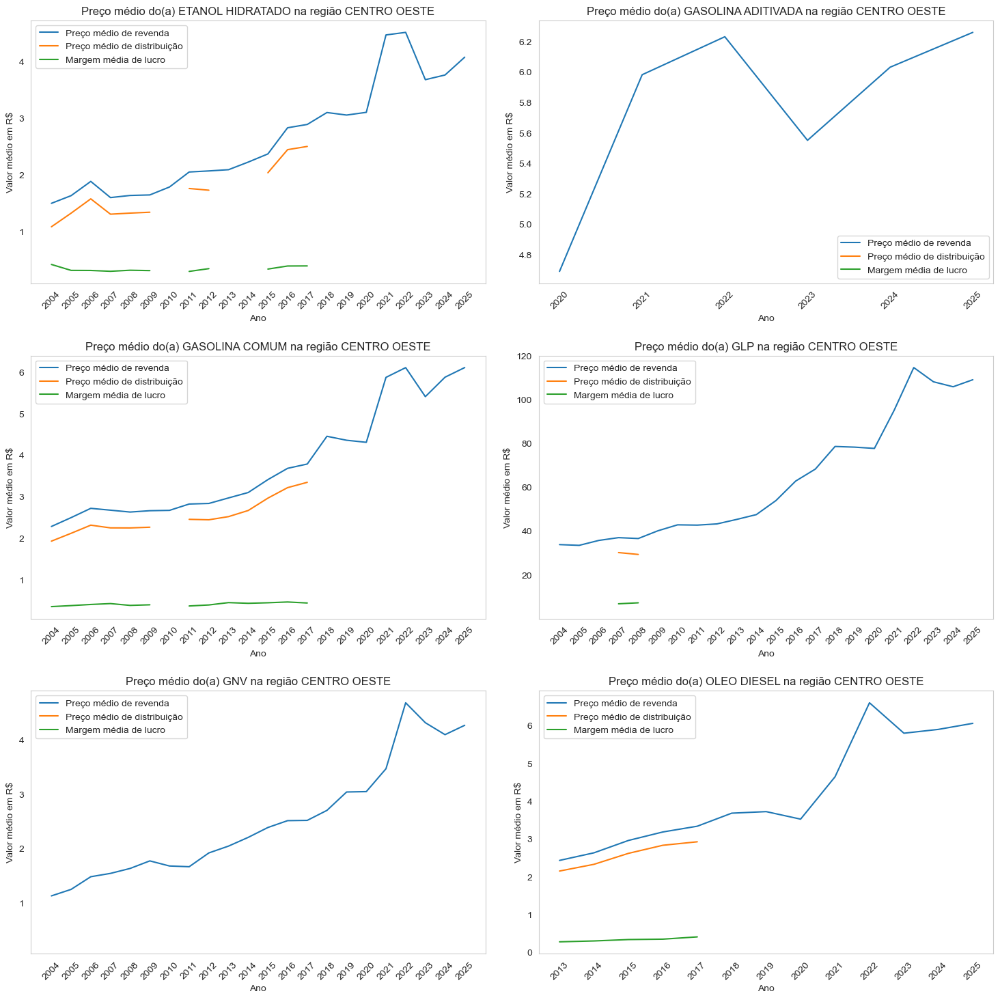

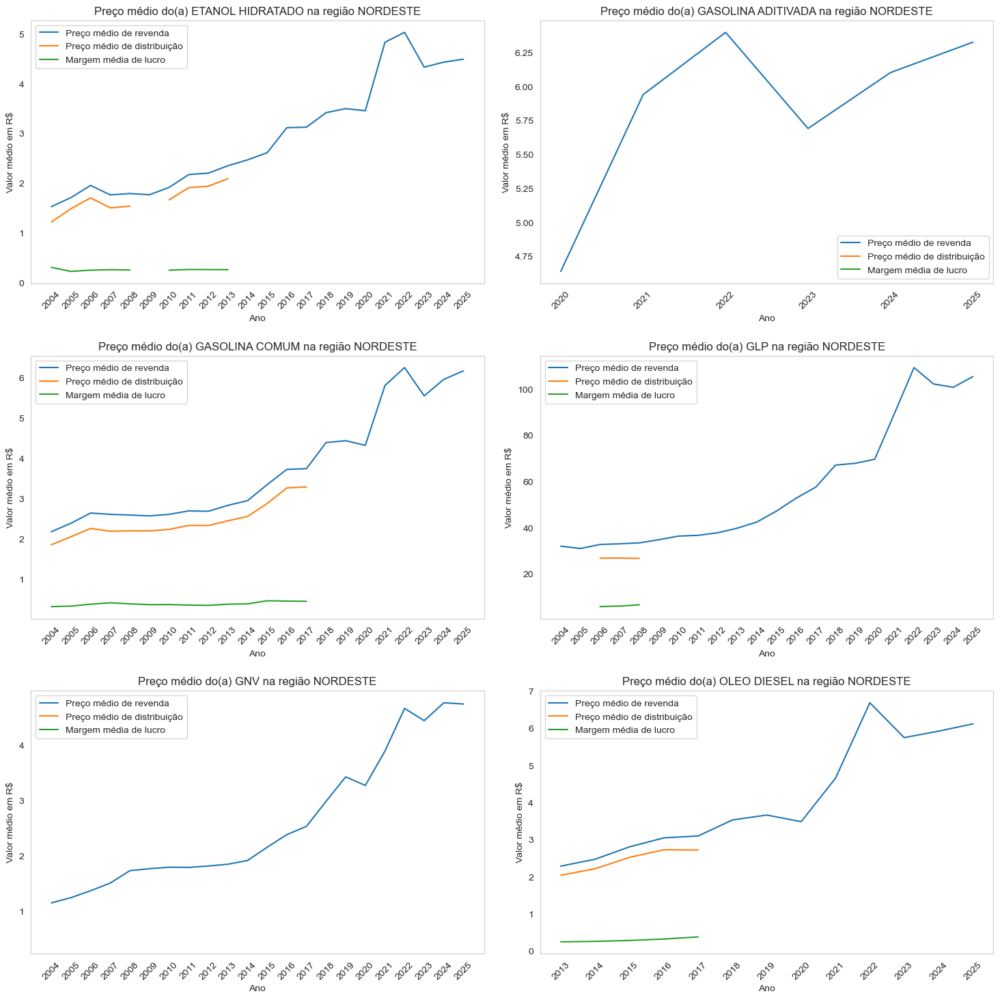

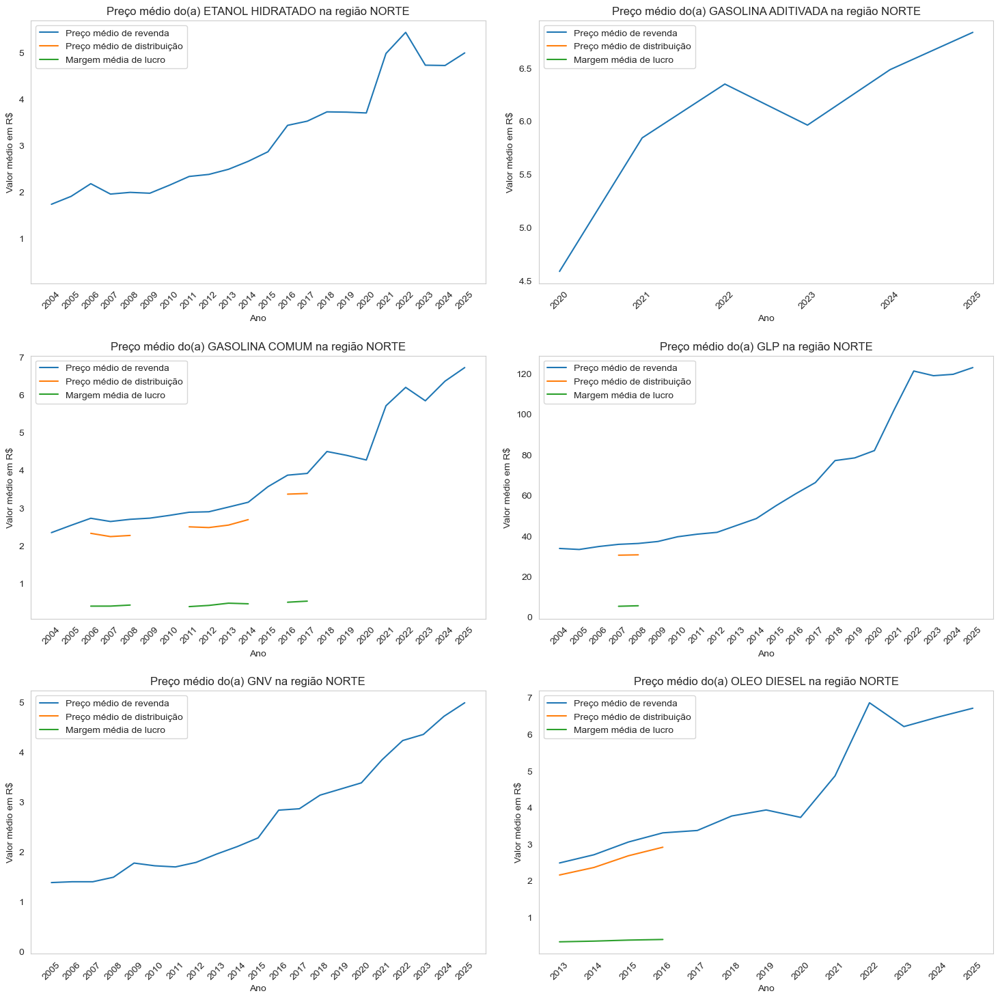

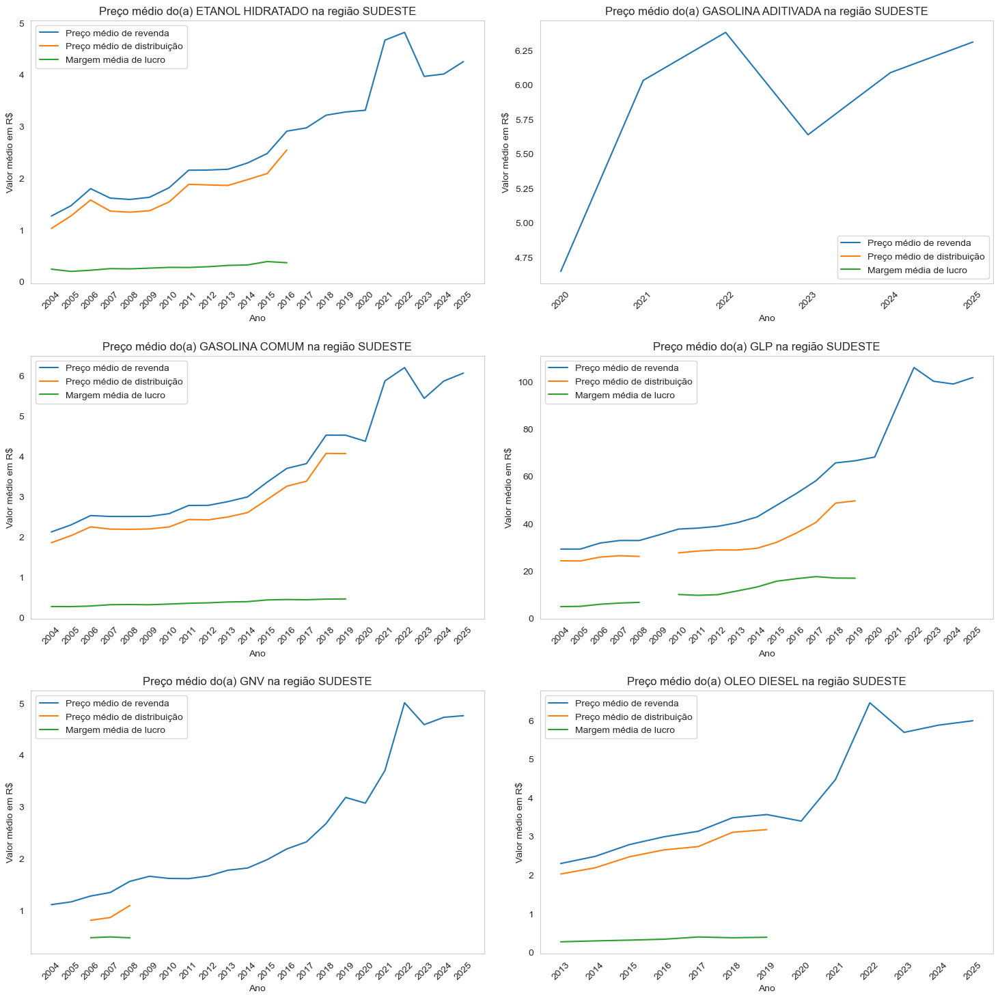

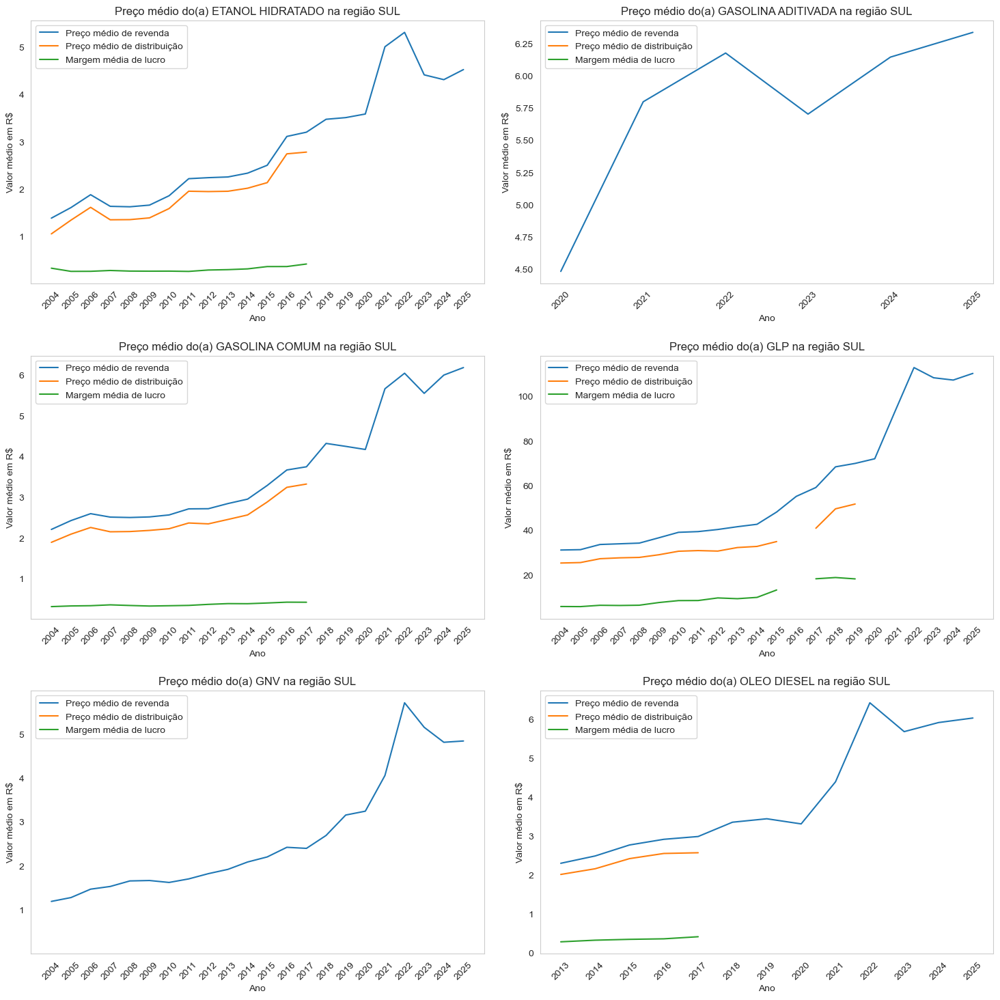

,ano,região,produto,preço_médio_revenda,preço_médio_distribuição,margem_média_revenda
0,2004,CENTRO OESTE,ETANOL HIDRATADO,1.495947,1.081227,0.414720
1,2004,CENTRO OESTE,GASOLINA COMUM,2.283545,1.930061,0.353485
2,2004,CENTRO OESTE,GLP,33.810697,28.286644,5.524053
3,2004,CENTRO OESTE,GNV,1.131970,0.844333,0.287636
4,2004,CENTRO OESTE,ÓLEO DIESEL,1.627833,1.434856,0.192977
...,...,...,...,...,...,...
639,2025,SUL,GASOLINA COMUM,6.187778,NaN,NaN
640,2025,SUL,GLP,110.278889,NaN,NaN
641,2025,SUL,GNV,4.845556,NaN,NaN
642,2025,SUL,OLEO DIESEL,6.024444,NaN,NaN


In [96]:
def preco_por_regiao():
    produtos = dados.produto.sort_values().unique().tolist()

    precos_revenda = dados[['ano', 'região', 'produto', 'preço_médio_revenda']] \
                          .groupby(['ano', 'região', 'produto']) \
                          .agg({'preço_médio_revenda' : np.average}) \
                          .reset_index()

    precos_distribuicao = dados[['ano', 'região', 'produto', 'preço_médio_distribuição']] \
                               .groupby(['ano', 'região', 'produto']) \
                               .agg({'preço_médio_distribuição' : np.average}) \
                               .reset_index()
   
    margens = dados[['ano', 'região', 'produto', 'margem_média_revenda']] \
                   .groupby(['ano', 'região', 'produto']) \
                   .agg({'margem_média_revenda' : np.average}) \
                   .reset_index()
    
    linhas = 3
    colunas = 2
        
    for r in dados.região.sort_values().unique().tolist():
        fig, ax = plt.subplots(figsize = (15, 15), nrows = linhas, ncols = colunas)
    
        p = 0
        
        for i in range(linhas):
            for j in range(colunas):            
                ax[i, j].grid()
                ax[i, j].set_xlabel('Ano')
                ax[i, j].set_ylabel('Valor médio em R$')

                anos = precos_revenda.loc[(precos_revenda.região == r) & (precos_revenda.produto == produtos[p]), 'ano'].unique().tolist()

                revenda = precos_revenda.loc[(precos_revenda.região == r) & (precos_revenda.produto == produtos[p]), 'preço_médio_revenda'].tolist()

                distrib = precos_distribuicao.loc[(precos_revenda.região == r) & (precos_revenda.produto == produtos[p]), 'preço_médio_distribuição'].tolist()

                lucro = margens.loc[(precos_revenda.região == r) & (precos_revenda.produto == produtos[p]), 'margem_média_revenda'].tolist()

                #quando não há dados sobre o produto atual (exemplo: GNV em Roraima)
                if(len(anos) == 0):
                    anos = dados.ano.unique().tolist()

                if(len(revenda) == 0):
                    revenda = np.zeros(shape=(len(anos), 1)).tolist()

                if(len(distrib) == 0):
                    distrib = np.zeros(shape=(len(anos), 1)).tolist()

                if(len(lucro) == 0):
                    lucro = np.zeros(shape=(len(anos), 1)).tolist()

                ax[i, j].set_title(f'Preço médio do(a) {produtos[p]} na região {r}')
                ax[i, j].set_xticks(np.arange(min(anos), max(anos) + 1, 1))

                ax[i, j].plot(anos, revenda, label = 'Preço médio de revenda')
                ax[i, j].plot(anos, distrib, label = 'Preço médio de distribuição')
                ax[i, j].plot(anos, lucro, label = 'Margem média de lucro')

                ax[i, j].legend()
                ax[i, j].tick_params(axis='x', rotation=45)

                p += 1
                p %= len(produtos)
    
        plt.tight_layout(pad = 2)
        plt.show()
    
    precos_revenda['preço_médio_distribuição'] = precos_distribuicao.preço_médio_distribuição
    precos_revenda['margem_média_revenda'] = margens.margem_média_revenda
    
    return precos_revenda

preco_por_regiao()

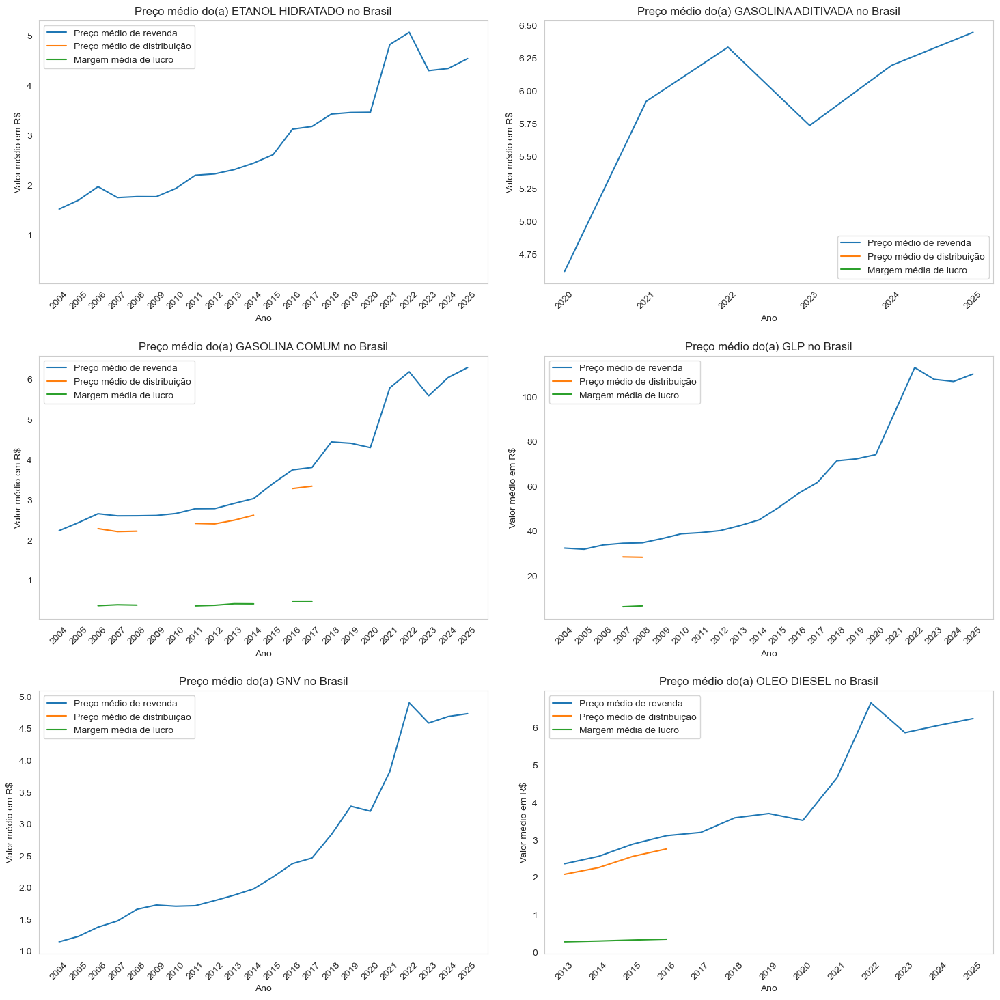

,ano,produto,preço_médio_revenda,preço_médio_distribuição,margem_média_revenda
0,2004,ETANOL HIDRATADO,1.521847,1.168218,0.353630
1,2004,GASOLINA COMUM,2.234284,1.889817,0.344467
2,2004,GLP,32.274633,NaN,NaN
3,2004,GNV,1.145797,NaN,NaN
4,2004,ÓLEO DIESEL,1.558047,1.365215,0.192832
...,...,...,...,...,...
124,2025,GASOLINA COMUM,6.291728,NaN,NaN
125,2025,GLP,110.221538,NaN,NaN
126,2025,GNV,4.731800,NaN,NaN
127,2025,OLEO DIESEL,6.237037,NaN,NaN


In [98]:
def preco_por_combustivel():
    produtos = dados.produto.sort_values().unique().tolist()

    precos_revenda = dados[['ano', 'produto', 'preço_médio_revenda']] \
                          .groupby(['ano', 'produto']) \
                          .agg({'preço_médio_revenda' : np.average}) \
                          .reset_index()

    precos_distribuicao = dados[['ano', 'produto', 'preço_médio_distribuição']] \
                               .groupby(['ano', 'produto']) \
                               .agg({'preço_médio_distribuição' : np.average}) \
                               .reset_index()
   
    margens = dados[['ano', 'produto', 'margem_média_revenda']] \
                   .groupby(['ano', 'produto']) \
                   .agg({'margem_média_revenda' : np.average}) \
                   .reset_index()

    linhas = 3
    colunas = 2

    fig, ax = plt.subplots(figsize = (15, 15), nrows = linhas, ncols = colunas)
    
    p = 0
        
    for i in range(linhas):
        for j in range(colunas):            
            ax[i, j].grid()
            ax[i, j].set_xlabel('Ano')
            ax[i, j].set_ylabel('Valor médio em R$')

            anos = precos_revenda.loc[(precos_revenda.produto == produtos[p]), 'ano'].unique().tolist()        
            
            revenda = precos_revenda.loc[(precos_revenda.produto == produtos[p]), 'preço_médio_revenda'].tolist()
            
            distrib = precos_distribuicao.loc[(precos_distribuicao.produto == produtos[p]), 'preço_médio_distribuição'].tolist()
            
            lucro = margens.loc[(margens.produto == produtos[p]), 'margem_média_revenda'].tolist()
            
            #quando não há dados sobre o produto atual (exemplo: GNV em Roraima)
            if(len(anos) == 0):
                anos = dados.ano.unique().tolist()
            
            if(len(revenda) == 0):
                revenda = np.zeros(shape=(len(anos), 1)).tolist()
            
            if(len(distrib) == 0):
                distrib = np.zeros(shape=(len(anos), 1)).tolist()
                
            if(len(lucro) == 0):
                lucro = np.zeros(shape=(len(anos), 1)).tolist()
                            
            ax[i, j].set_title(f'Preço médio do(a) {produtos[p]} no Brasil')
            ax[i, j].set_xticks(np.arange(min(anos), max(anos) + 1, 1))

            ax[i, j].plot(anos, revenda, label = 'Preço médio de revenda')
            ax[i, j].plot(anos, distrib, label = 'Preço médio de distribuição')
            ax[i, j].plot(anos, lucro, label = 'Margem média de lucro')

            ax[i, j].legend()
            ax[i, j].tick_params(axis='x', rotation=45)

            p += 1
            p %= len(produtos)
    
    plt.tight_layout(pad = 2)
    plt.show()
    
    precos_revenda['preço_médio_distribuição'] = precos_distribuicao.preço_médio_distribuição
    precos_revenda['margem_média_revenda'] = margens.margem_média_revenda
    
    return precos_revenda

preco_por_combustivel()

### Estados em que houve a maior alta/baixa de preços de combustíveis no período disponível (2004 a 2020)

In [14]:
def calculaVariacao(array):
    return ((max(array) - min(array)) / min(array)) * 100

def variacao_preco_estado():
    dados_variacao = dados[['estado', 'produto', 'preço_médio_revenda']] \
                            .groupby(['estado', 'produto']) \
                            .agg({'preço_médio_revenda' : calculaVariacao}) \
                            .sort_values('preço_médio_revenda')
    
    menor_alta_baixa = 'alta' if (dados_variacao.head(1).preço_médio_revenda.values >= 0) else 'baixa'
    maior_alta_baixa = 'alta' if (dados_variacao.tail(1).preço_médio_revenda.values >= 0) else 'baixa'
    
    menor_preco = dados_variacao.head(1).preço_médio_revenda.values[0]
    maior_preco = dados_variacao.tail(1).preço_médio_revenda.values[0]
    
    menor_estado = dados_variacao.head(1).index.values[0][0]
    maior_estado = dados_variacao.tail(1).index.values[0][0]
    
    menor_produto = dados_variacao.head(1).index.values[0][1]
    maior_produto = dados_variacao.tail(1).index.values[0][1]

    print(f'Estado com a menor {menor_alta_baixa} de preço entre {min(anos)} e {max(anos)}: {menor_estado} ({menor_produto}, {menor_preco:.2f}%)\n' +
          f'Estado com a maior {maior_alta_baixa} de preço entre {min(anos)} e {max(anos)}: {maior_estado} ({maior_produto}, {maior_preco:.2f}%)')
    
    return dados_variacao

variacao_preco_estado()

Estado com a menor alta de preço entre 2004 e 2025: RORAIMA (GNV, 0.00%)
Estado com a maior alta de preço entre 2004 e 2025: SAO PAULO (ETANOL HIDRATADO, 598.17%)


,,preço_médio_revenda
estado,produto,
RORAIMA,GNV,0.000000
ACRE,GNV,3.070175
CEARA,ÓLEO DIESEL,41.471354
AMAZONAS,ÓLEO DIESEL,47.299078
DISTRITO FEDERAL,ÓLEO DIESEL,48.750000
...,...,...
RIO GRANDE DO SUL,ETANOL HIDRATADO,479.918033
SAO PAULO,GNV,491.365462
RIO DE JANEIRO,ETANOL HIDRATADO,509.523810


### Combustíveis que sofreram os maiores aumentos/as maiores baixas de preço no período disponível (2004 a 2020)

In [16]:
def variacao_preco_produto():
    dados_variacao = dados[['estado', 'produto', 'preço_médio_revenda']] \
                            .groupby(['produto']) \
                            .agg({'preço_médio_revenda' : calculaVariacao}) \
                            .sort_values('preço_médio_revenda')
    
    menor_alta_baixa = 'alta' if (dados_variacao.head(1).preço_médio_revenda.values >= 0) else 'baixa'
    maior_alta_baixa = 'alta' if (dados_variacao.tail(1).preço_médio_revenda.values >= 0) else 'baixa'
    
    menor_preco = dados_variacao.head(1).preço_médio_revenda.values[0]
    maior_preco = dados_variacao.tail(1).preço_médio_revenda.values[0]
    
    menor_produto = dados_variacao.head(1).index.values[0]
    maior_produto = dados_variacao.tail(1).index.values[0]

    print(f'Produto com a menor {menor_alta_baixa} de preço entre {min(anos)} e {max(anos)}: {menor_produto} ({menor_preco:.2f}%)\n' +
          f'Produto com a maior {maior_alta_baixa} de preço entre {min(anos)} e {max(anos)}: {maior_produto} ({maior_preco:.2f}%)')
    
    return dados_variacao

variacao_preco_produto()

Produto com a menor alta de preço entre 2004 e 2025: ÓLEO DIESEL (102.82%)
Produto com a maior alta de preço entre 2004 e 2025: ETANOL HIDRATADO (823.63%)


,preço_médio_revenda
produto,
ÓLEO DIESEL,102.817974
GASOLINA ADITIVADA,116.030138
OLEO DIESEL S10,297.652582
OLEO DIESEL,324.491772
GASOLINA COMUM,330.932203
GLP,389.902234
GNV,627.179487
ETANOL HIDRATADO,823.629243


### Estado com o maior número de postos de combustíveis

In [18]:
def estado_mais_postos():
    estado = dados[['estado', 'número_de_postos_pesquisados']] \
                .sort_values('número_de_postos_pesquisados')\
                .tail(1)\
                .iat[0, 0]
    
    print(f'Estado com o maior número de postos de combustíveis: {estado}')

estado_mais_postos()

Estado com o maior número de postos de combustíveis: SAO PAULO


### Estado com a maior diferença entre o preço médio de distribuição e o preço médio de revenda

In [20]:
def estado_maior_diferenca_distrib_revenda():
    precos = dados[['estado', 'produto', 'preço_médio_distribuição', 'preço_médio_revenda']].dropna()
    precos['diferenca'] = precos.preço_médio_revenda - precos.preço_médio_distribuição
    precos = precos.groupby(['estado', 'produto']).agg({'diferenca' : np.average})
    precos.sort_values('diferenca', inplace = True)
    
    resposta = precos.tail(1)
    estado = resposta.index.values[0][0]
    produto = resposta.index.values[0][1]
    diferenca = resposta.iat[0, 0]
    
    print(f'{estado} é o estado com a maior diferença entre o preço médio de distribuição e o preço médio de ' +
          f'revenda no período entre {min(anos)} e {max(anos)}: {produto}, R$ {diferenca:.2f} (margem de lucro)')
    
    return precos

estado_maior_diferenca_distrib_revenda()

MATO GROSSO é o estado com a maior diferença entre o preço médio de distribuição e o preço médio de revenda no período entre 2004 e 2025: GLP, R$ 12.43 (margem de lucro)


,,diferenca
estado,produto,
PIAUI,GNV,0.148500
SERGIPE,ÓLEO DIESEL,0.158371
PERNAMBUCO,ÓLEO DIESEL,0.173040
MARANHAO,ÓLEO DIESEL,0.174155
PARAIBA,ÓLEO DIESEL,0.174711
...,...,...
RIO GRANDE DO SUL,GLP,11.810653
AMAPA,GLP,11.863129
TOCANTINS,GLP,11.912721


### Estado com o maior/o menor preço de revenda de cada combustível

In [22]:
def estado_maior_revenda_combustivel():    
    produtos = dados.produto.unique().tolist()
    
    revenda_p = dados[['produto', 'estado', 'preço_médio_revenda']] \
                    .groupby(['produto', 'estado']) \
                    .agg({'preço_médio_revenda' : np.average}) \
                    .sort_values('preço_médio_revenda')
    
    for p in produtos:
        idx = pd.IndexSlice
        produto_atual = revenda_p.loc[idx[p, :], :]
        
        menor = produto_atual.head(1).iat[0, 0]
        maior = produto_atual.tail(1).iat[0, 0]
                
        estado_menor = produto_atual.head(1).index.values[0][1]
        estado_maior = produto_atual.tail(1).index.values[0][1]
        
        print(f'{p} -> mais caro em/na/no {estado_maior} (R$ {maior:.2f}); ' +
              f'mais barato em/na/no {estado_menor} (R$ {menor:.2f})')
    
    return revenda_p

estado_maior_revenda_combustivel()

ETANOL HIDRATADO -> mais caro em/na/no ACRE (R$ 3.23); mais barato em/na/no SAO PAULO (R$ 2.28)
GASOLINA COMUM -> mais caro em/na/no ACRE (R$ 4.13); mais barato em/na/no SAO PAULO (R$ 3.48)
GLP -> mais caro em/na/no MATO GROSSO (R$ 70.66); mais barato em/na/no PERNAMBUCO (R$ 52.00)
GNV -> mais caro em/na/no DISTRITO FEDERAL (R$ 5.86); mais barato em/na/no PIAUI (R$ 1.62)
ÓLEO DIESEL -> mais caro em/na/no ACRE (R$ 2.34); mais barato em/na/no BAHIA (R$ 1.87)
OLEO DIESEL -> mais caro em/na/no ACRE (R$ 4.83); mais barato em/na/no PARANA (R$ 3.78)
OLEO DIESEL S10 -> mais caro em/na/no ACRE (R$ 4.79); mais barato em/na/no PARANA (R$ 3.89)
GASOLINA ADITIVADA -> mais caro em/na/no ACRE (R$ 6.52); mais barato em/na/no AMAPA (R$ 5.63)


preço_médio_revenda
produto     estado                           
GNV         PIAUI                    1.621356
ÓLEO DIESEL BAHIA                    1.874078
            PARAIBA                  1.879640
            PARANA                   1.885785
            MINAS GERAIS             1.886530
...                                       ...
GLP         AMAPA                   63.913006
            TOCANTINS               64.716650
            ACRE                    64.955400
            RORAIMA                 65.395568
            MATO GROSSO             70.656934

[216 rows x 1 columns]

### Produto mais barato/caro por estado

In [24]:
def produtos_preco_estado():    
    estados = dados.estado.sort_values().unique().tolist()
    
    precos = dados[['produto', 'estado', 'preço_médio_revenda']] \
                .groupby(['estado', 'produto']) \
                .agg({'preço_médio_revenda' : np.average}) \
                .sort_values('preço_médio_revenda')

    for e in estados:
        idx = pd.IndexSlice
        estado_atual = precos.loc[idx[e, :], :]
        
        menor = estado_atual.head(1).iat[0, 0]
        maior = estado_atual.tail(1).iat[0, 0]

        produto_barato = estado_atual.head(1).index.values[0][1]
        produto_caro = estado_atual.tail(1).index.values[0][1]
                
        print(f'{e} -> {produto_barato} é o combustível mais barato (R$ {menor:.2f}); ' +
              f'{produto_caro} é o combustível mais caro (R$ {maior:.2f})')
    
    return precos
        
produtos_preco_estado()

ACRE -> GNV é o combustível mais barato (R$ 2.32); GLP é o combustível mais caro (R$ 64.96)
ALAGOAS -> ÓLEO DIESEL é o combustível mais barato (R$ 1.91); GLP é o combustível mais caro (R$ 53.56)
AMAPA -> ÓLEO DIESEL é o combustível mais barato (R$ 2.08); GLP é o combustível mais caro (R$ 63.91)
AMAZONAS -> ÓLEO DIESEL é o combustível mais barato (R$ 2.04); GLP é o combustível mais caro (R$ 57.77)
BAHIA -> ÓLEO DIESEL é o combustível mais barato (R$ 1.87); GLP é o combustível mais caro (R$ 54.22)
CEARA -> ÓLEO DIESEL é o combustível mais barato (R$ 1.92); GLP é o combustível mais caro (R$ 58.01)
DISTRITO FEDERAL -> ÓLEO DIESEL é o combustível mais barato (R$ 1.93); GLP é o combustível mais caro (R$ 56.84)
ESPIRITO SANTO -> ÓLEO DIESEL é o combustível mais barato (R$ 1.94); GLP é o combustível mais caro (R$ 53.57)
GOIAS -> ÓLEO DIESEL é o combustível mais barato (R$ 1.90); GLP é o combustível mais caro (R$ 57.59)
MARANHAO -> ÓLEO DIESEL é o combustível mais barato (R$ 1.91); GLP é o comb

,,preço_médio_revenda
estado,produto,
PIAUI,GNV,1.621356
BAHIA,ÓLEO DIESEL,1.874078
PARAIBA,ÓLEO DIESEL,1.879640
PARANA,ÓLEO DIESEL,1.885785
MINAS GERAIS,ÓLEO DIESEL,1.886530
...,...,...
AMAPA,GLP,63.913006
TOCANTINS,GLP,64.716650
ACRE,GLP,64.955400


### Produto mais barato/caro por região

In [26]:
def produtos_preco_regiao():    
    regioes = dados.região.sort_values().unique().tolist()
    
    precos = dados[['produto', 'região', 'preço_médio_revenda']] \
                  .groupby(['região', 'produto']) \
                  .agg({'preço_médio_revenda' : np.average}) \
                  .sort_values('preço_médio_revenda')
    
    for r in regioes:
        idx = pd.IndexSlice
        regiao_atual = precos.loc[idx[r, :], :]
        
        menor = regiao_atual.head(1).iloc[0, 0]
        maior = regiao_atual.tail(1).iloc[0, 0]
        
        produto_barato = regiao_atual.head(1).index.values[0][1]
        produto_caro = regiao_atual.tail(1).index.values[0][1]
                
        print(f'{r} -> {produto_barato} é o combustível mais barato (R$ {menor:.2f}); ' +
              f'{produto_caro} é o combustível mais caro (R$ {maior:.2f})')
    
    return precos
        
produtos_preco_regiao()

CENTRO OESTE -> ÓLEO DIESEL é o combustível mais barato (R$ 2.02); GLP é o combustível mais caro (R$ 61.53)
NORDESTE -> ÓLEO DIESEL é o combustível mais barato (R$ 1.90); GLP é o combustível mais caro (R$ 55.51)
NORTE -> ÓLEO DIESEL é o combustível mais barato (R$ 2.11); GLP é o combustível mais caro (R$ 62.79)
SUDESTE -> ÓLEO DIESEL é o combustível mais barato (R$ 1.91); GLP é o combustível mais caro (R$ 54.86)
SUL -> ÓLEO DIESEL é o combustível mais barato (R$ 1.94); GLP é o combustível mais caro (R$ 57.58)


,,preço_médio_revenda
região,produto,
NORDESTE,ÓLEO DIESEL,1.904330
SUDESTE,ÓLEO DIESEL,1.905391
SUL,ÓLEO DIESEL,1.942902
CENTRO OESTE,ÓLEO DIESEL,2.020587
NORTE,ÓLEO DIESEL,2.111750
SUDESTE,GNV,2.409819
CENTRO OESTE,GNV,2.507681
NORDESTE,GNV,2.508084
CENTRO OESTE,ETANOL HIDRATADO,2.588538


### Produto mais barato/caro no país

In [28]:
def produtos_preco_pais():
    precos = dados[['produto', 'preço_médio_revenda']] \
                  .groupby('produto') \
                  .agg({'preço_médio_revenda' : np.average}) \
                  .sort_values('preço_médio_revenda')

    menor = precos.head(1).iloc[0, 0]
    maior = precos.tail(1).iloc[0, 0]
    
    produto_barato = precos.head(1).index.values[0]
    produto_caro = precos.tail(1).index.values[0]

    print(f'{produto_barato} é o combustível mais barato (R$ {menor:.2f})\n' +
          f'{produto_caro} é o combustível mais caro (R$ {maior:.2f})')
    
    return precos
        
produtos_preco_pais()

ÓLEO DIESEL é o combustível mais barato (R$ 1.98)
GLP é o combustível mais caro (R$ 58.42)


,preço_médio_revenda
produto,
ÓLEO DIESEL,1.979761
GNV,2.509139
ETANOL HIDRATADO,2.847045
GASOLINA COMUM,3.698722
OLEO DIESEL,4.029132
OLEO DIESEL S10,4.130763
GASOLINA ADITIVADA,5.987907
GLP,58.422275


## Visualização Geográfica dos Dados

In [30]:
#importando bibliotecas para dados geográficos
import geopandas as gpd
import descartes
import time
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns
sns.set_style('whitegrid')

geo_data = gpd.read_file('Dados IBGE', encoding = 'utf-8')

In [31]:
geo_data

,NM_ESTADO,NM_REGIAO,CD_GEOCUF,geometry
0,RONDÔNIA,NORTE,11,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982..."
1,ACRE,NORTE,12,"POLYGON ((-73.18253 -7.3355, -73.05413 -7.3819..."
2,AMAZONAS,NORTE,13,"POLYGON ((-67.32609 2.02971, -67.31682 2.00125..."
3,RORAIMA,NORTE,14,"POLYGON ((-60.20051 5.26434, -60.19828 5.26045..."
4,PARÁ,NORTE,15,"MULTIPOLYGON (((-46.06095 -1.0947, -46.06666 -..."
5,AMAPÁ,NORTE,16,"MULTIPOLYGON (((-50.18123 1.90099, -50.17688 1..."
6,TOCANTINS,NORTE,17,"POLYGON ((-48.35878 -5.17008, -48.35617 -5.171..."
7,MARANHÃO,NORDESTE,21,"MULTIPOLYGON (((-43.99913 -2.39272, -43.99937 ..."
8,PIAUÍ,NORDESTE,22,"POLYGON ((-41.74605 -2.8035, -41.74241 -2.8057..."
9,CEARÁ,NORDESTE,23,"POLYGON ((-40.49717 -2.78451, -40.49173 -2.788..."


In [32]:
geo_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   NM_ESTADO  27 non-null     object  
 1   NM_REGIAO  27 non-null     object  
 2   CD_GEOCUF  27 non-null     object  
 3   geometry   27 non-null     geometry
dtypes: geometry(1), object(3)
memory usage: 996.0+ bytes


In [33]:
#adequação dos nomes dos estados e das regiões ao dataset principal

dic_estados = {'RONDÔNIA' : 'RONDONIA', 'PARÁ' : 'PARA', 'AMAPÁ' : 'AMAPA', 'MARANHÃO' : 'MARANHAO',
               'PIAUÍ' : 'PIAUI', 'CEARÁ' : 'CEARA', 'PARAÍBA' : 'PARAIBA', 'ESPÍRITO SANTO' : 'ESPIRITO SANTO',
               'SÃO PAULO' : 'SAO PAULO', 'PARANÁ' : 'PARANA', 'GOIÁS' : 'GOIAS', 'ACRE' : 'ACRE',
               'AMAZONAS' : 'AMAZONAS', 'RORAIMA' : 'RORAIMA', 'TOCANTINS' : 'TOCANTINS', 
               'RIO GRANDE DO NORTE' : 'RIO GRANDE DO NORTE', 'PERNAMBUCO' : 'PERNAMBUCO', 
               'ALAGOAS' : 'ALAGOAS', 'SERGIPE' : 'SERGIPE', 'BAHIA' : 'BAHIA', 'MINAS GERAIS' : 'MINAS GERAIS',
               'RIO DE JANEIRO' : 'RIO DE JANEIRO', 'SANTA CATARINA' : 'SANTA CATARINA', 
               'MATO GROSSO DO SUL' : 'MATO GROSSO DO SUL', 'MATO GROSSO' : 'MATO GROSSO', 
               'DISTRITO FEDERAL' : 'DISTRITO FEDERAL', 'RIO GRANDE DO SUL' : 'RIO GRANDE DO SUL'}

geo_data['NM_ESTADO'] = geo_data.NM_ESTADO.map(dic_estados)

geo_data["NM_REGIAO"] = geo_data.NM_REGIAO.str.replace('-', ' ')

geo_data

,NM_ESTADO,NM_REGIAO,CD_GEOCUF,geometry
0,RONDONIA,NORTE,11,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982..."
1,ACRE,NORTE,12,"POLYGON ((-73.18253 -7.3355, -73.05413 -7.3819..."
2,AMAZONAS,NORTE,13,"POLYGON ((-67.32609 2.02971, -67.31682 2.00125..."
3,RORAIMA,NORTE,14,"POLYGON ((-60.20051 5.26434, -60.19828 5.26045..."
4,PARA,NORTE,15,"MULTIPOLYGON (((-46.06095 -1.0947, -46.06666 -..."
5,AMAPA,NORTE,16,"MULTIPOLYGON (((-50.18123 1.90099, -50.17688 1..."
6,TOCANTINS,NORTE,17,"POLYGON ((-48.35878 -5.17008, -48.35617 -5.171..."
7,MARANHAO,NORDESTE,21,"MULTIPOLYGON (((-43.99913 -2.39272, -43.99937 ..."
8,PIAUI,NORDESTE,22,"POLYGON ((-41.74605 -2.8035, -41.74241 -2.8057..."
9,CEARA,NORDESTE,23,"POLYGON ((-40.49717 -2.78451, -40.49173 -2.788..."


In [34]:
#Coordinate Reference System (CRS) : posiciona as coordenadas do IBGE em relação ao globo terrestre
geo_data.crs = {"init": "epsg:4326"}

geo_data.dissolve(by = 'NM_REGIAO')

C:\Users\davir\anaconda3\Lib\site-packages\pyproj\crs\crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geometry,NM_ESTADO,CD_GEOCUF
NM_REGIAO,,,
CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",MATO GROSSO DO SUL,50
NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ...",MARANHAO,21
NORTE,"MULTIPOLYGON (((-61.57433 -8.80232, -61.57142 ...",RONDONIA,11
SUDESTE,"MULTIPOLYGON (((-48.03781 -25.35643, -48.03773...",MINAS GERAIS,31
SUL,"MULTIPOLYGON (((-49.71293 -29.3275, -49.71294 ...",PARANA,41


In [35]:
#obter dados geográficos por região
geo_data_regioes = geo_data.dissolve(by = 'NM_REGIAO').reset_index()[['NM_REGIAO', 'geometry']]
geo_data_regioes.rename(columns = {'NM_REGIAO' : 'região'}, inplace = True)

geo_data_regioes

,região,geometry
0,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8..."
1,NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ..."
2,NORTE,"MULTIPOLYGON (((-61.57433 -8.80232, -61.57142 ..."
3,SUDESTE,"MULTIPOLYGON (((-48.03781 -25.35643, -48.03773..."
4,SUL,"MULTIPOLYGON (((-49.71293 -29.3275, -49.71294 ..."


### Variação percentual dos preços médios de revenda dos combustíveis por região no período entre 2004 e 2020

In [37]:
#calcular a variação percentual por região/produto
variacao_regiao = dados[['região', 'estado', 'produto', 'preço_médio_revenda']] \
                        .groupby(['região', 'produto']) \
                        .agg({'preço_médio_revenda' : calculaVariacao})

variacao_regiao.reset_index(inplace = True)
variacao_regiao.rename(columns = {'preço_médio_revenda' : 'variação'}, inplace = True)

variacao_regiao

,região,produto,variação
0,CENTRO OESTE,ETANOL HIDRATADO,455.938038
1,CENTRO OESTE,GASOLINA ADITIVADA,72.727273
2,CENTRO OESTE,GASOLINA COMUM,299.276860
3,CENTRO OESTE,GLP,370.410892
4,CENTRO OESTE,GNV,546.308113
5,CENTRO OESTE,OLEO DIESEL,269.863014
6,CENTRO OESTE,OLEO DIESEL S10,259.403255
7,CENTRO OESTE,ÓLEO DIESEL,68.153310
8,NORDESTE,ETANOL HIDRATADO,454.614733
9,NORDESTE,GASOLINA ADITIVADA,99.018669


In [38]:
#merge com geo_data_regioes
geo_variacao_regioes = geo_data_regioes.merge(variacao_regiao, on = 'região')

geo_variacao_regioes

,região,geometry,produto,variação
0,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",ETANOL HIDRATADO,455.938038
1,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GASOLINA ADITIVADA,72.727273
2,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GASOLINA COMUM,299.276860
3,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GLP,370.410892
4,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GNV,546.308113
5,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",OLEO DIESEL,269.863014
6,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",OLEO DIESEL S10,259.403255
7,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",ÓLEO DIESEL,68.153310
8,NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ...",ETANOL HIDRATADO,454.614733
9,NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ...",GASOLINA ADITIVADA,99.018669


C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3675121170.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3675121170.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3675121170.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3675121170.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or

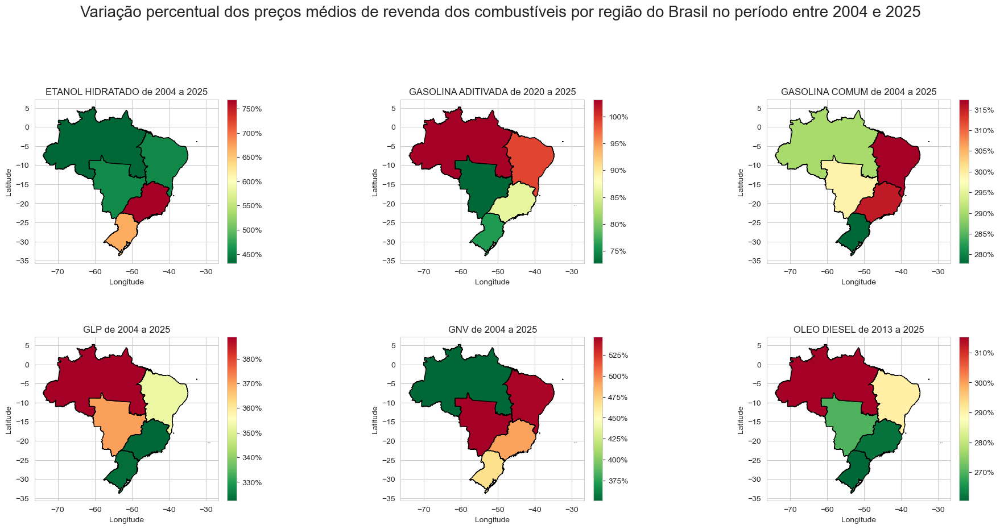

,região,geometry,produto,variação
0,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",ETANOL HIDRATADO,455.938038
1,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GASOLINA ADITIVADA,72.727273
2,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GASOLINA COMUM,299.276860
3,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GLP,370.410892
4,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",GNV,546.308113
5,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",OLEO DIESEL,269.863014
6,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",OLEO DIESEL S10,259.403255
7,CENTRO OESTE,"POLYGON ((-50.51034 -12.85823, -50.50895 -12.8...",ÓLEO DIESEL,68.153310
8,NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ...",ETANOL HIDRATADO,454.614733
9,NORDESTE,"MULTIPOLYGON (((-45.84248 -1.05011, -45.84027 ...",GASOLINA ADITIVADA,99.018669


In [94]:
def mapa_regiao_percentual():    
    #calcular a variação percentual por região/produto
    variacao_regiao = dados[['região', 'estado', 'produto', 'preço_médio_revenda']] \
                            .groupby(['região', 'produto']) \
                            .agg({'preço_médio_revenda' : calculaVariacao})

    variacao_regiao.reset_index(inplace = True)
    variacao_regiao.rename(columns = {'preço_médio_revenda' : 'variação'}, inplace = True)

    #obter dados geográficos por região
    geo_data_regioes = geo_data.dissolve(by = 'NM_REGIAO').reset_index()[['NM_REGIAO', 'geometry']]
    geo_data_regioes.rename(columns = {'NM_REGIAO' : 'região'}, inplace = True)

    #merge com geo_data_regioes
    geo_variacao_regioes = geo_data_regioes.merge(variacao_regiao, on = 'região')

    linhas = 2
    colunas = 3

    produtos = geo_variacao_regioes.produto.unique().tolist()

    fig, ax = plt.subplots(figsize = (20, 10), nrows = linhas, ncols = colunas)

    i = 0

    for lin in range(linhas):
        for col in range(colunas):
            divider = make_axes_locatable(ax[lin, col])
            cax = divider.append_axes('right', size = '5%', pad = 0.1)

            percentuais = geo_variacao_regioes[geo_variacao_regioes.produto == produtos[i]]

            percentuais.plot(column = 'variação', legend = True, ax = ax[lin, col],
                             cmap = 'RdYlGn_r', cax = cax, edgecolor = 'black')

            anos = dados.loc[dados.produto == produtos[i], 'ano'].unique().tolist()

            ax[lin, col].set_title(produtos[i] + ' de ' + str(min(anos)) + ' a ' + str(max(anos)))
            ax[lin, col].set_xlabel('Longitude')
            ax[lin, col].set_ylabel('Latitude')

            #cax: axes on which to draw the legend in case of color map
            cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])

            i += 1

    anos = dados['ano'].unique().tolist()
        
    fig.suptitle(f'Variação percentual dos preços médios de revenda dos combustíveis ' +
                 f'por região do Brasil no período entre {min(anos)} e {max(anos)}', fontsize = 20)
    plt.tight_layout(pad = 5)
    plt.show()

    return geo_variacao_regioes

mapa_regiao_percentual()

### Variação percentual dos preços médios de revenda dos combustíveis por estado no período entre 2004 e 2020

C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3504836784.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3504836784.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3504836784.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\3504836784.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or

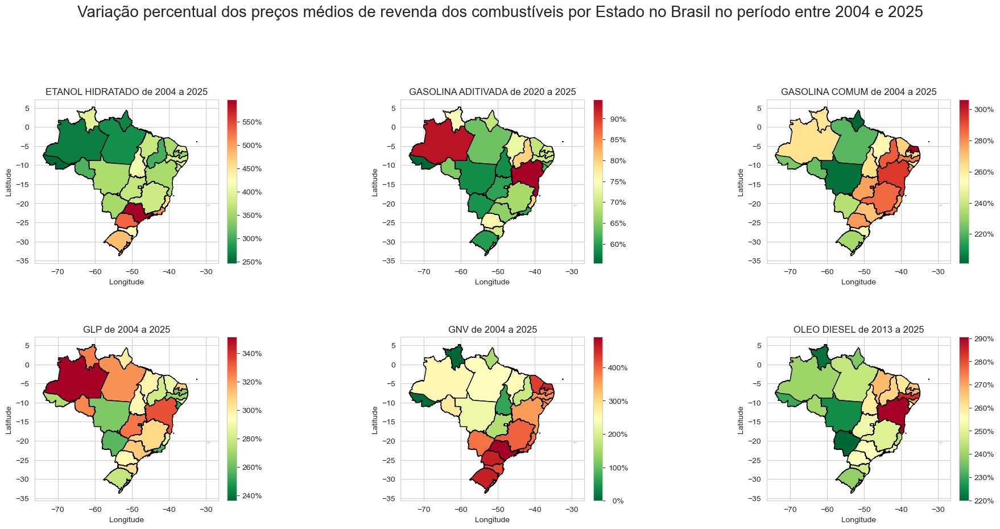

,estado,geometry,produto,variação
0,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",ETANOL HIDRATADO,306.392694
1,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GASOLINA ADITIVADA,64.903950
2,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GASOLINA COMUM,222.871883
3,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GLP,323.666404
4,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GNV,276.538146
...,...,...,...,...
211,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",GLP,277.809313
212,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",GNV,457.363014
213,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",OLEO DIESEL,239.138405
214,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",OLEO DIESEL S10,233.778966


In [90]:
def mapa_estado_percentual():    
    #calcular a variação percentual por estado/produto
    variacao_estado = dados[['região', 'estado', 'produto', 'preço_médio_revenda']] \
                            .groupby(['estado', 'produto']) \
                            .agg({'preço_médio_revenda' : calculaVariacao})

    variacao_estado.reset_index(inplace = True)
    variacao_estado.rename(columns = {'preço_médio_revenda' : 'variação'}, inplace = True)

    #obter dados geográficos por estado
    geo_data_estado = geo_data.drop('NM_REGIAO', axis = 1)[['NM_ESTADO', 'geometry']]
    geo_data_estado.rename(columns = {'NM_ESTADO' : 'estado'}, inplace = True)

    #merge com geo_data_estado
    geo_variacao_estados = geo_data_estado.merge(variacao_estado, on = 'estado')
    
    linhas = 2
    colunas = 3

    produtos = geo_variacao_estados.produto.unique().tolist()

    fig, ax = plt.subplots(figsize = (20, 10), nrows = linhas, ncols = colunas)

    i = 0

    for lin in range(linhas):
        for col in range(colunas):
            divider = make_axes_locatable(ax[lin, col])
            cax = divider.append_axes('right', size = '5%', pad = 0.1)

            percentuais = geo_variacao_estados[geo_variacao_estados.produto == produtos[i]]

            percentuais.plot(column = 'variação', legend = True, ax = ax[lin, col],
                             cmap = 'RdYlGn_r', cax = cax, edgecolor = 'black')

            anos = dados.loc[dados.produto == produtos[i], 'ano'].unique().tolist()

            ax[lin, col].set_title(produtos[i] + ' de ' + str(min(anos)) + ' a ' + str(max(anos)))
            ax[lin, col].set_xlabel('Longitude')
            ax[lin, col].set_ylabel('Latitude')

            #cax: axes on which to draw the legend in case of color map
            cax.set_yticklabels(['{0:3.0f}%'.format(ytick) for ytick in cax.get_yticks()])

            i += 1

    anos = dados['ano'].unique().tolist()
    
    fig.suptitle(f'Variação percentual dos preços médios de revenda dos combustíveis ' +
                 f'por Estado no Brasil no período entre {min(anos)} e {max(anos)}', fontsize = 20)
    plt.tight_layout(pad = 5)
    plt.show()

    return geo_variacao_estados

mapa_estado_percentual()

### Preço médio dos combustíveis por Estado no período entre 2004 e 2020

C:\Users\davir\AppData\Local\Temp\ipykernel_6748\4125043587.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['R$ {0:2.2f}'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\4125043587.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['R$ {0:2.2f}'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\4125043587.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cax.set_yticklabels(['R$ {0:2.2f}'.format(ytick) for ytick in cax.get_yticks()])
C:\Users\davir\AppData\Local\Temp\ipykernel_6748\4125043587.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_tick

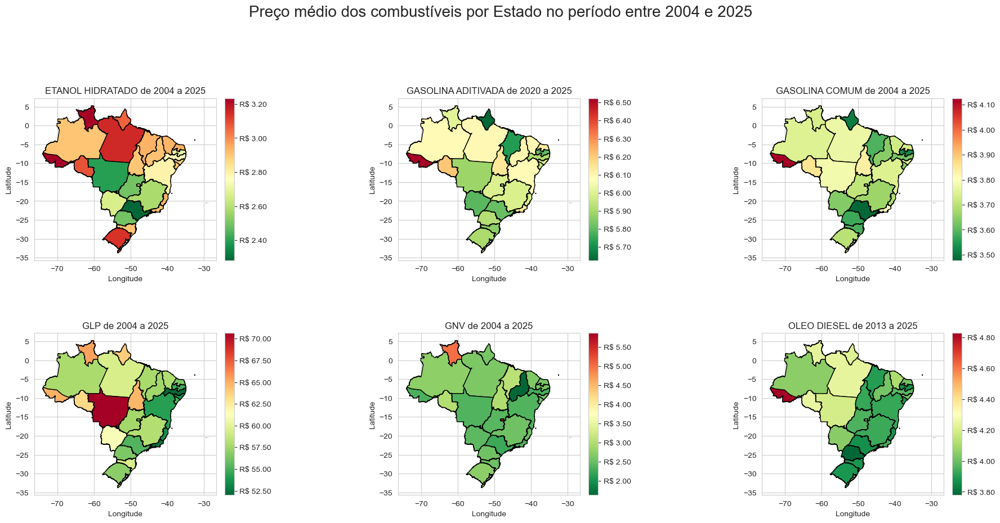

,estado,geometry,produto,preço_médio
0,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",ETANOL HIDRATADO,3.084549
1,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GASOLINA ADITIVADA,6.209362
2,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GASOLINA COMUM,3.855132
3,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GLP,63.380562
4,RONDONIA,"POLYGON ((-62.86662 -7.97587, -62.86017 -7.982...",GNV,3.006000
...,...,...,...,...
211,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",GLP,56.813848
212,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",GNV,2.717952
213,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",OLEO DIESEL,3.882740
214,RIO GRANDE DO SUL,"POLYGON ((-53.03183 -27.15947, -53.02991 -27.1...",OLEO DIESEL S10,4.005672


In [84]:
def mapa_estado_combustivel():
    #calcular a média do preço médio de revenda por estado/produto
    preco_estado = dados[['região', 'estado', 'produto', 'preço_médio_revenda']] \
                        .groupby(['estado', 'produto']) \
                        .agg({'preço_médio_revenda' : np.average})

    preco_estado.reset_index(inplace = True)
    preco_estado.rename(columns = {'preço_médio_revenda' : 'preço_médio'}, inplace = True)

    #obter dados geográficos por estado
    geo_data_estado = geo_data.drop('NM_REGIAO', axis = 1)[['NM_ESTADO', 'geometry']]
    geo_data_estado.rename(columns = {'NM_ESTADO' : 'estado'}, inplace = True)

    #merge com geo_data_estado
    geo_precos_estados = geo_data_estado.merge(preco_estado, on = 'estado')
    
    linhas = 2
    colunas = 3

    produtos = geo_precos_estados.produto.unique().tolist()

    fig, ax = plt.subplots(figsize = (20, 10), nrows = linhas, ncols = colunas)

    i = 0

    for lin in range(linhas):
        for col in range(colunas):
            divider = make_axes_locatable(ax[lin, col])
            cax = divider.append_axes('right', size = '5%', pad = 0.1)

            precos = geo_precos_estados[geo_precos_estados.produto == produtos[i]]

            precos.plot(column = 'preço_médio', legend = True, ax = ax[lin, col],
                        cmap = 'RdYlGn_r', cax = cax, edgecolor = 'black')

            anos = dados.loc[dados.produto == produtos[i], 'ano'].unique().tolist()

            ax[lin, col].set_title(produtos[i] + ' de ' + str(min(anos)) + ' a ' + str(max(anos)))
            ax[lin, col].set_xlabel('Longitude')
            ax[lin, col].set_ylabel('Latitude')

            #cax: axes on which to draw the legend in case of color map
            cax.set_yticklabels(['R$ {0:2.2f}'.format(ytick) for ytick in cax.get_yticks()])

            i += 1

    anos = dados['ano'].unique().tolist()
    
    fig.suptitle(f'Preço médio dos combustíveis por Estado no período entre {min(anos)} e {max(anos)}', fontsize = 20)
    plt.tight_layout(pad = 5)
    plt.show()

    return geo_precos_estados

mapa_estado_combustivel()

### Comparação de combustíveis por Estado

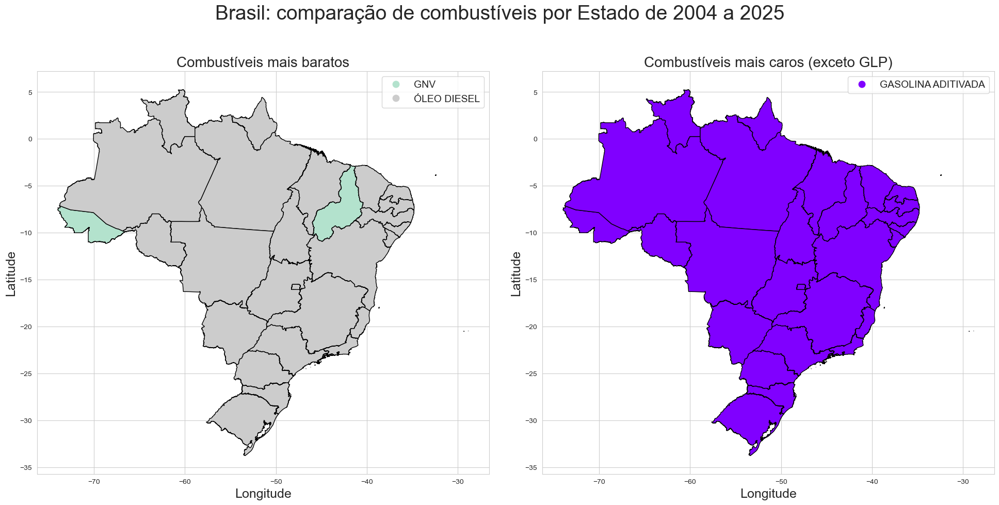

In [88]:
def comparacao_combustivel_estado():
    preco_estado = dados[['região', 'estado', 'produto', 'preço_médio_revenda']] \
                        .groupby(['estado', 'produto']) \
                        .agg({'preço_médio_revenda' : np.average})

    preco_estado.reset_index(inplace = True)
    preco_estado.rename(columns = {'preço_médio_revenda' : 'preço_médio'}, inplace = True)

    #obter dados geográficos por estado
    geo_data_estado = geo_data.drop('NM_REGIAO', axis = 1)[['NM_ESTADO', 'geometry']]
    geo_data_estado.rename(columns = {'NM_ESTADO' : 'estado'}, inplace = True)

    #merge com geo_data_estado
    geo_precos_estados = geo_data_estado.merge(preco_estado, on = 'estado')

    mais_baratos, mais_caros = pd.DataFrame(), pd.DataFrame()
    estados = geo_precos_estados.estado.unique().tolist()

    for e in estados:
        grupo_estado = geo_precos_estados[geo_precos_estados.produto != 'GLP'].groupby('estado').get_group(e)

        combustivel = grupo_estado[grupo_estado.preço_médio == grupo_estado.preço_médio.min()]
        mais_baratos = pd.concat([mais_baratos, combustivel], ignore_index=True)

        combustivel = grupo_estado[grupo_estado.preço_médio == grupo_estado.preço_médio.max()]
        mais_caros = pd.concat([mais_caros, combustivel], ignore_index=True)

    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 10))

    #choropleths of cheapest and most expensive fuels
    mais_baratos.plot(column = 'produto', cmap = 'Pastel2', ax = ax[0], 
                      edgecolor = 'black', legend = True, legend_kwds = {'fontsize' : 14})
    
    mais_caros.plot(column = 'produto', cmap = 'rainbow', ax = ax[1], 
                    edgecolor = 'black', legend = True, legend_kwds = {'fontsize' : 14})

    #format figure and axes
    ax[0].set_title('Combustíveis mais baratos', fontsize = 20)
    ax[0].set_xlabel('Longitude', fontsize = 18)
    ax[0].set_ylabel('Latitude', fontsize = 18)
        
    ax[1].set_title('Combustíveis mais caros (exceto GLP)', fontsize = 20)
    ax[1].set_xlabel('Longitude', fontsize = 18)
    ax[1].set_ylabel('Latitude', fontsize = 18)

    anos = dados['ano'].unique().tolist()
    plt.suptitle(f'Brasil: comparação de combustíveis por Estado de {min(anos)} a {max(anos)}', fontsize = 28)
    plt.tight_layout(pad = 3)
    plt.show()

comparacao_combustivel_estado()